# Booking Forecast for BikeIntel 
###### Project by Pulkit Mehta https://github.com/pulkitmehta

Welcome Fellas to my notebook. Here I will demonstrate how I predicted Bike Rentals through Active Machine Learning Startegies instead of Complex Deep Learning Strategies while not or little compromising with accuracies. 

This Notebook is a mature version of previous research nb which can be found on my GitHub repository. But it is fair if you want to skip.

Here I will go through all the snippets and Visualizations throughout.

## What business problem model I am trying to solve?

Well BikeIntel project is a multi goal oriented project. Specifically, here we are predicting a regression time series forecast.

Suppose Company X offers bike rental services in a city. They want to solve a problem of shortage of bikes at a particular renting station also they want to intimate their customers about when the demand is expected to go high (So they may pre-book).

Solution is to forecast number of bookings in coming hours.


![](cover_img.jpg)

## Why not Deep Learning Startegies this time?

It has been evident that DL strategies have been proved super accurate in solving problems BUT many times there is a downside of high computational and running model costs.

So My goal is Low Costs and Better Performance.

### So what can be done?
Well most effort has been put in robust Feature Engineering and Model Selection with active visualisation side by side.

- Full Project Repo: https://github.com/pulkitmehta/bikeIntel

## Importing Necessary Libraries and Classes

In [1]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
import os, data_paths as dp
import seaborn as sns

from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

from sklearn.preprocessing import MinMaxScaler

%matplotlib inline

## What type of data are we dealing with?

Most of the data preprocessing part has been done in separate notebook named Data Transformations but I will explain breifly.

So, Origginal data was in the form of all the bookings (2015-20) as a rows from different stations with many parameters like duration, lat/long, start station, end station etc.

I had to carry out various data transformations in ordered to think a solution and subsequently head to feature engineering.

1. I took all the bookings of one station.
2. Feature-ised it in YY, MM, DD, HH, mm etc.
3. I added a Day of the week feature (calculated from pandas functionality) as day would have significant impact in results (say weekends and weekdays)
4. I decided to make Hour of the day (HH) as a categorical feature and binned in time slots of 3 hours. 
     (0-3, 3-6, 6-9, 9-12, 12-15, 15,18, 18-21, 21-0)
5. Hence our results would be in the same way.

All this data was stored in separate directory structure and linked by a custom written data pipeline module "data_paths" which I imported earlier.

This will enable us to maintain reusability of code and better data organisation especially in the case of live data.

So here we load our data!

In [2]:
grove_data = pd.read_csv(dp.data_avenue+dp.stationswise+dp.stations[0]+"/"+dp.stations[0]+"_bookings.csv")

## Checking the data Distribution

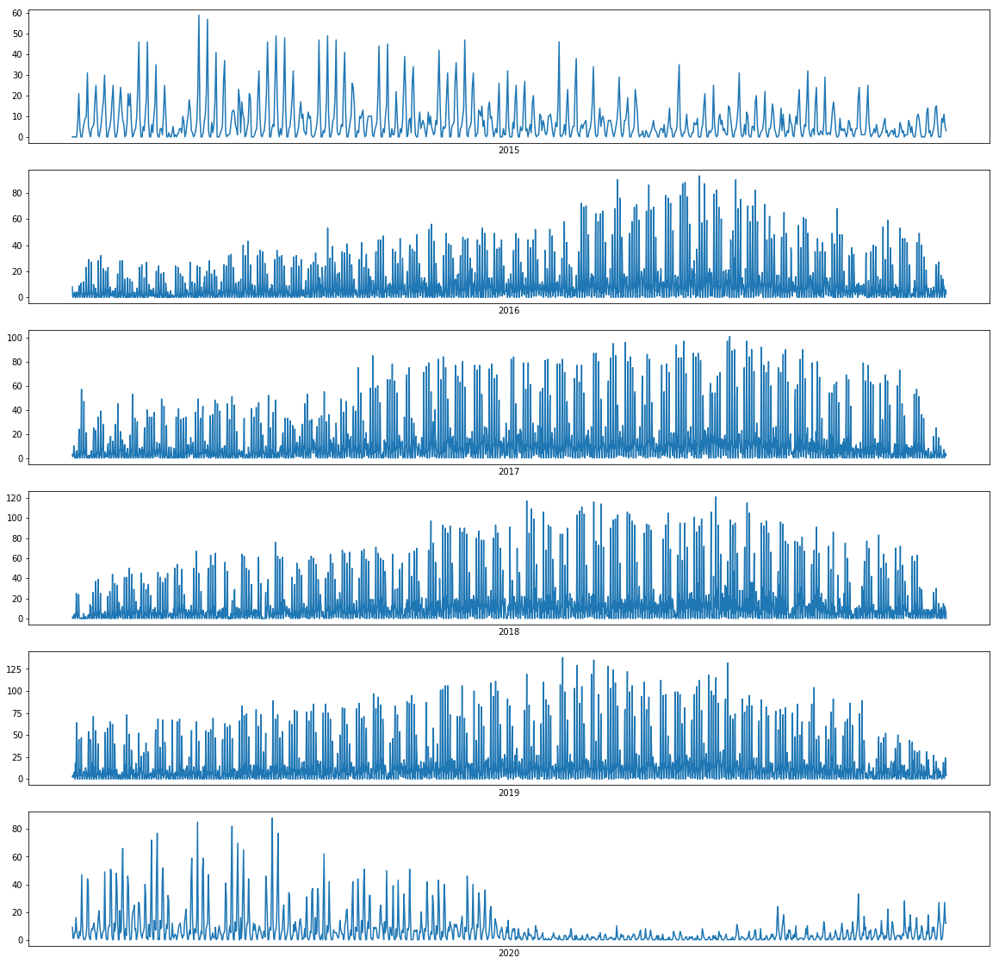

In [3]:
plt.figure(figsize=(20,20))
for yy in [2015,2016,2017,2018,2019,2020]:
    plt.subplot(6,1,yy-2014)
    plt.plot(grove_data[grove_data['YY'] == yy]['Bookings'].values)
    plt.xticks(())
    plt.xlabel(yy)
plt.show()

#### Insights form above:
* peaks are attained each day
* A little increase in bookings in subsequent year
* Impact of Covid-19 in year 2020.

### Let's check more Infomation

In [4]:
grove_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13648 entries, 0 to 13647
Data columns (total 6 columns):
YY          13648 non-null int64
MM          13648 non-null int64
DD          13648 non-null int64
Day         13648 non-null int64
HH          13648 non-null object
Bookings    13648 non-null int64
dtypes: int64(5), object(1)
memory usage: 639.8+ KB


#### Note: I decided to convert Day, MM, DD as categorical features

#### So, here we go...

In [5]:
grove_data['Day'] = grove_data['Day'].astype(object)
grove_data['MM'] = grove_data['MM'].astype(object)
grove_data['DD'] = grove_data['DD'].astype(object)

In [6]:
grove_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13648 entries, 0 to 13647
Data columns (total 6 columns):
YY          13648 non-null int64
MM          13648 non-null object
DD          13648 non-null object
Day         13648 non-null object
HH          13648 non-null object
Bookings    13648 non-null int64
dtypes: int64(2), object(4)
memory usage: 639.8+ KB


In [7]:
grove_dummies = pd.get_dummies(grove_data)

In [8]:
grove_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13648 entries, 0 to 13647
Data columns (total 60 columns):
YY          13648 non-null int64
Bookings    13648 non-null int64
MM_1        13648 non-null uint8
MM_2        13648 non-null uint8
MM_3        13648 non-null uint8
MM_4        13648 non-null uint8
MM_5        13648 non-null uint8
MM_6        13648 non-null uint8
MM_7        13648 non-null uint8
MM_8        13648 non-null uint8
MM_9        13648 non-null uint8
MM_10       13648 non-null uint8
MM_11       13648 non-null uint8
MM_12       13648 non-null uint8
DD_1        13648 non-null uint8
DD_2        13648 non-null uint8
DD_3        13648 non-null uint8
DD_4        13648 non-null uint8
DD_5        13648 non-null uint8
DD_6        13648 non-null uint8
DD_7        13648 non-null uint8
DD_8        13648 non-null uint8
DD_9        13648 non-null uint8
DD_10       13648 non-null uint8
DD_11       13648 non-null uint8
DD_12       13648 non-null uint8
DD_13       13648 non-null uint8


### Let us Check Correlations among features

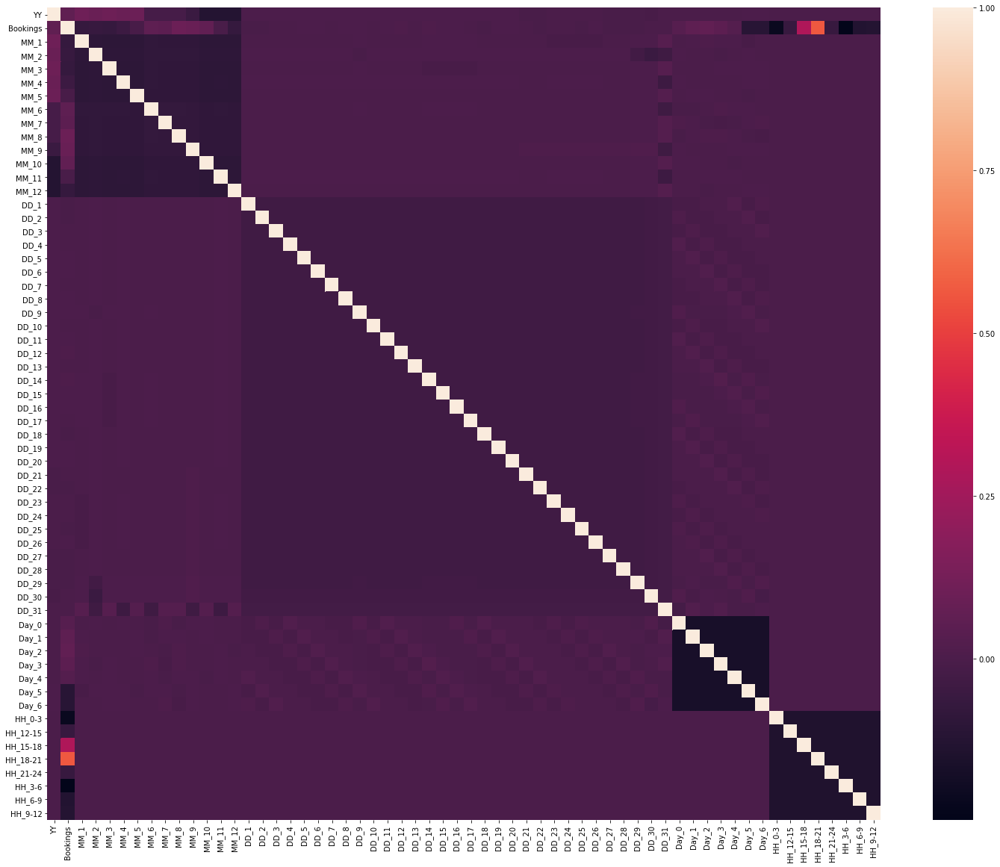

In [9]:
plt.figure(figsize=(25,20))
sns.heatmap(grove_dummies.corr())
plt.show()

#### Insights from above:
- Bookings are mostly imapacted positive linearly in time slots of 15-18 and 18-21 Hrs. which is obvious in evening time and rest Hours it is inversely correlated to hrs
- Bookings are negatively impacted on weekends ie (Day 5 and Day 6) where Day 1 is Monday.
- And One minute insight is in the month of January and December. Again this is obvious as Holidays Season is on the peak.

## Helper Functions
These functions would ease our process throughout by adding reusability and will provide valuable running results.

Let's Check first one:

### 1. Train-Test data Splitting
#### Inputs:
- DataFrame to Split
- Index to which Train data would end exclusively and Test data would begin inclusively.
- Number of test data days to keep.
- if Test days is None, all remeing days are taken into account as test.

#### Outputs:
- Tuple with Train Test splitted data

In [10]:
def tt_split(df, split_idx, test_days = None):
    train = df.iloc[:split_idx,:]
    
    if test_days == None:
        test = df.iloc[split_idx:,:]
    else:
        test_end_idx = split_idx + (test_days * 8) 
        test = df.iloc[split_idx:test_end_idx+1,:]
        '''
        I multiplied days with 8 as 8 rows are there for single day as 8 time slots.
        '''
        
        
    X_train = train.drop(columns = ["Bookings"]).values
    X_test = test.drop(columns = ["Bookings"]).values
    y_train = train["Bookings"].values
    y_test = test["Bookings"].values
    
    return X_train, X_test, y_train, y_test

### 2. Model Performance
- Inputs: ScikitLearn Model, Training and Testing data
- Returns: Trained Model

- First Model Fits the Train Data (ln 2)
- Various Train Test Scores are calculated (R^2, RMS, Mean Absolute Error) (ln 5 - 15)
- Then I stored all values as string in a matrix perf_matrix
- Rest it prints the model and its Hyperparameters and Plots the results
- It shows all the scores in a table over Plot.
- We can easily detect all the biases and train quality through it.

In [64]:
def modelPerformance(model, X_train,X_test, y_train, y_test):
    print("====================================================================================")
    model.fit(X_train, y_train)
    
    train_score = model.score(X_train, y_train)
    test_score = model.score(X_test, y_test)
    
    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)
    
    train_rms = np.sqrt(np.sum(np.square(train_predictions - y_train)) / y_train.shape[0])
    test_rms = np.sqrt(np.sum(np.square(test_predictions - y_test)) / y_test.shape[0])
    
    train_mae = np.sum(np.sqrt(np.square(y_train - train_predictions))) / y_train.shape[0]
    test_mae = np.sum(np.sqrt(np.square(y_test - test_predictions))) / y_test.shape[0]
    
    
    
    perf_matrix = [
        ["Train", str(train_score), str(train_rms), str(train_mae)],
        ["Test", str(test_score), str(test_rms), str(test_mae)]
    ]
    print("Model: ",model,"\n\nPerformance and Predictions Trend: ")
    print(perf_matrix)
    plt.figure(figsize=(20,5))
    plt.plot(y_train, label = "Train Values")
    plt.plot(train_predictions, '--', label = "Predicted Train Values")
    plt.xlabel("Date")
    plt.ylabel("Rentals")
    plt.legend()
    plt.show()
    plt.figure(figsize=(20,5))
    plt.plot(y_test, label = "Test Values")
    plt.plot(test_predictions, '--', label = "Predicted Test Values")

    plt.xlabel("Date")
    plt.ylabel("Rentals")
    
    plt.table(cellText=perf_matrix,
        cellLoc="center", colWidths=None,
        rowLabels=None, rowColours=None, rowLoc="center",
        colLabels=["Data","R^2 Score","RMS Score","MAE Score"], colColours="yyyy", colLoc="center",
        loc='top', bbox=None)
    plt.legend()
    plt.box(True)
    plt.show()
    
    
    return model, test_predictions

### 3. Data Retrieval Function
- It helps me to retrieve data of specified set of parameters which are optional accordingly
- Say I want data for May,2020 , my params would be yy = 2020, mm = 5 and dd= None
- Say I want data for 20,May,2020 , my params would be yy = 2020, mm = 5 and dd = 5.
- It uses powerful vectorisation provided by pandas.

In [12]:
def retrieveData(data, yy = None, mm = None, dd = None):
    data = data
    
    if yy != None:
        
        data = data[data['YY'] == yy]
        
        if mm != None:
            
            data = data[data['MM'] == mm]
            
            if dd != None:
                
                data = data[data['DD'] == dd]
                
    return data

### Here I Used all above together as a demonstration

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.7755129755203438', '8.642967826918186', '4.5353925353925355'], ['Test', '0.7130912065646999', '9.20406754852174', '5.6305220883534135']]


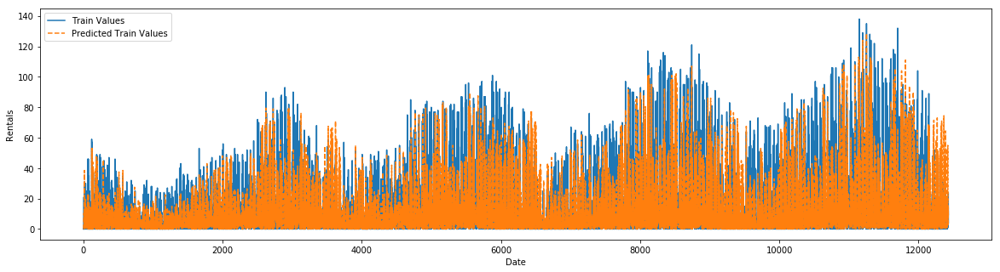

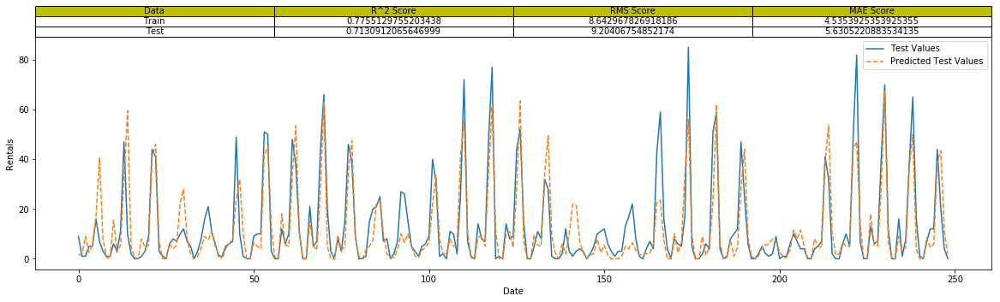

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [13]:
yy = 2020
mm = 1
X_train, X_test, y_train, y_test = tt_split(grove_dummies,retrieveData(grove_data, yy, mm).index[0], 
                                            test_days = 31)
modelPerformance(KNeighborsRegressor(n_neighbors=2),X_train,X_test,y_train,y_test)

## Feature Engineering and Model Selection
### Scaling
- Scaling would be very important as Gradient Descent based Methods are sesnsitive to magnitude of values 
- Neighbour based (Distance based Optimizations) techniques also required magnitudes to be scaled.
- Tree based would be robust against magnitude.
- So I will try scaling values within 0 and 1

In [14]:
scaler = MinMaxScaler(feature_range=(0,1))

In [15]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.7670647516006774', '8.80409825448615', '4.580678893178893'], ['Test', '0.6002604539363444', '10.864166810295565', '6.2730923694779115']]


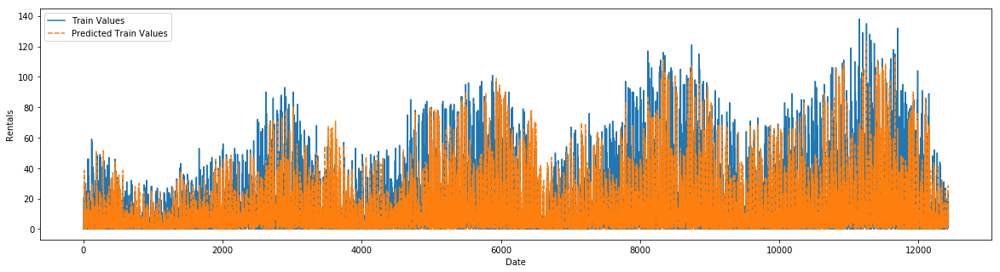

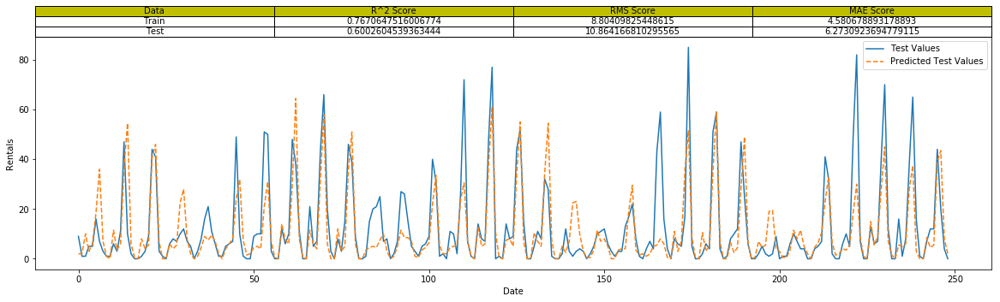

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [16]:
modelPerformance(KNeighborsRegressor(n_neighbors=2), X_train_scaled, X_test_scaled, y_train, y_test)

## Sequence Memory Inclusion

As I was trying out models in other notebooks, I realised that the results were not upto mark, So I came across a great idea. I remembered that in Deep Learning Techniques, LSTMs models are used widely for sequence predicions, They have a unique functionality of inclusion of a memory element, Meaning: They compute the result while taking old values in account too. In our case, Today 3pm Bookings would be calculated on the basis of bookings of previous time slots also. 

It makes sense as generally whenever a peak is attained, during next timeslots bookings are more dependent on previous

So these feauture sets will be dealt as input for our model too along with existing features, ready for concatenation.

Following function will generate the same:

In [1]:
def memoryFeatures(inpt, n_features):
    '''
    n_features will decide how many previous instances to be taken into account.
    '''
    
    outpt = np.zeros((n_features,n_features), dtype = int)
    for i in range(len(inpt)):
        row = np.array(inpt[i-n_features : i])
        outpt = np.append(outpt, row)
    del inpt
    return outpt.reshape(-1,n_features)

In [18]:
outpt = memoryFeatures(grove_data['Bookings'].values, 5)

##### Result:

In [19]:
pd.DataFrame(outpt).tail(10)

,0,1,2,3,4
13638,0,1,8,15,27
13639,1,8,15,27,13
13640,8,15,27,13,11
13641,15,27,13,11,0
13642,27,13,11,0,0
13643,13,11,0,0,2
13644,11,0,0,2,9
13645,0,0,2,9,15
13646,0,2,9,15,27
13647,2,9,15,27,12


In [20]:
del outpt '''Free the memory :p'''

### This function will finally generate and return the dataframe

In [21]:
def genMemDataset(df, memory):
    return pd.concat([df, pd.DataFrame(memoryFeatures(df['Bookings'].values,
                                                      memory))], axis = 1, ignore_index=False)

### Let's test our results with fllowing models

In [22]:
models = [LinearRegression(),
          KNeighborsRegressor(n_neighbors=1),
          KNeighborsRegressor(n_neighbors=2), 
          KNeighborsRegressor(n_neighbors=3), 
          KNeighborsRegressor(n_neighbors=4),
          RandomForestRegressor(n_estimators=5), 
          RandomForestRegressor(n_estimators=10), 
          RandomForestRegressor(n_estimators=50),
          RandomForestRegressor(n_estimators=100),
          RandomForestRegressor(n_estimators=500)]

Model:  LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False) 

Performance and Predictions Trend: 
[['Train', '0.7203932411300998', '9.645863397565638', '6.356864887468296'], ['Test', '0.6759881946365112', '9.781113190526046', '6.781990265750502']]


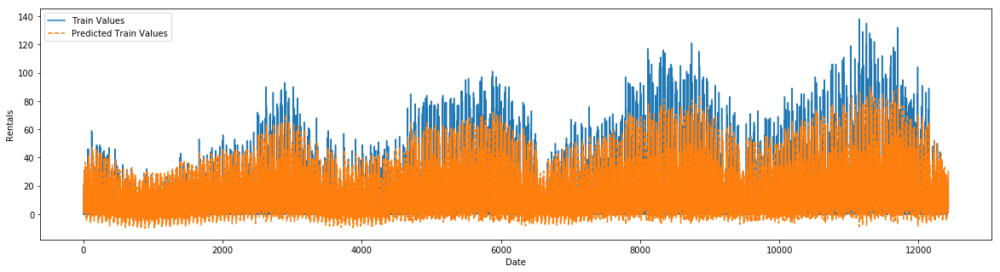

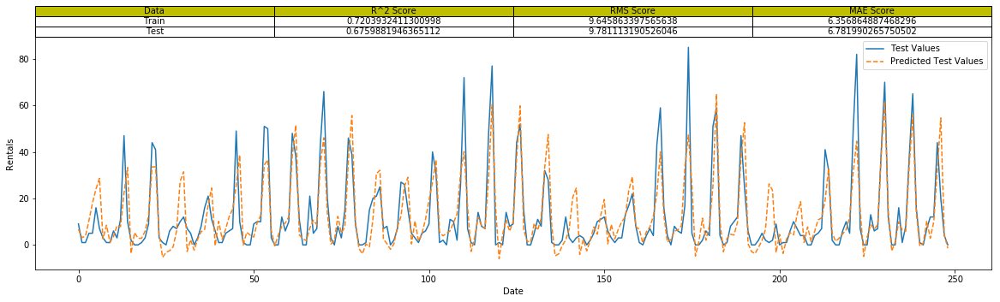

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=1, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '1.0', '0.0', '0.0'], ['Test', '0.4659666276358118', '12.557178461887638', '6.975903614457831']]


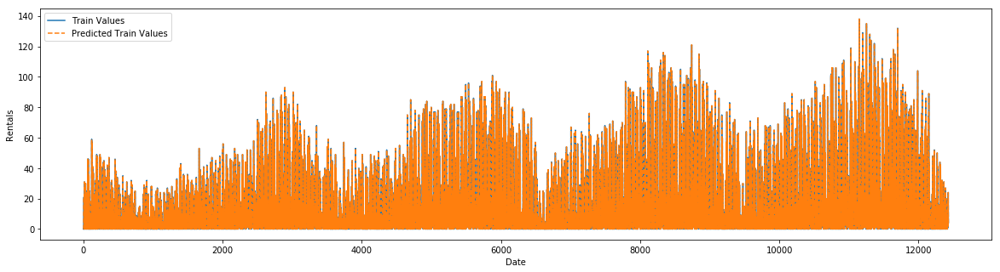

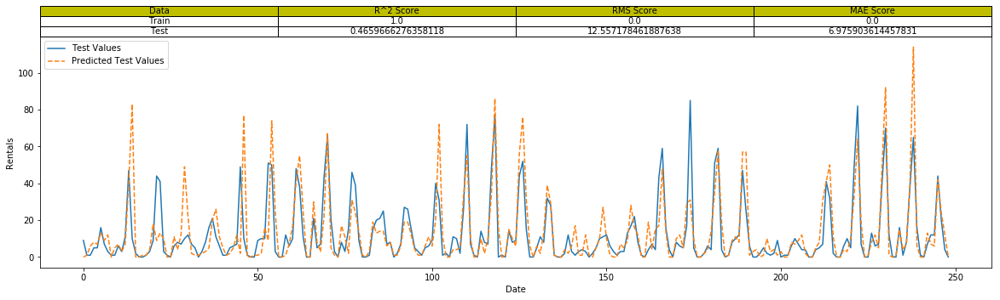

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9232547041929907', '5.053510318379348', '2.9473938223938223'], ['Test', '0.528771280792515', '11.795700666635597', '6.393574297188755']]


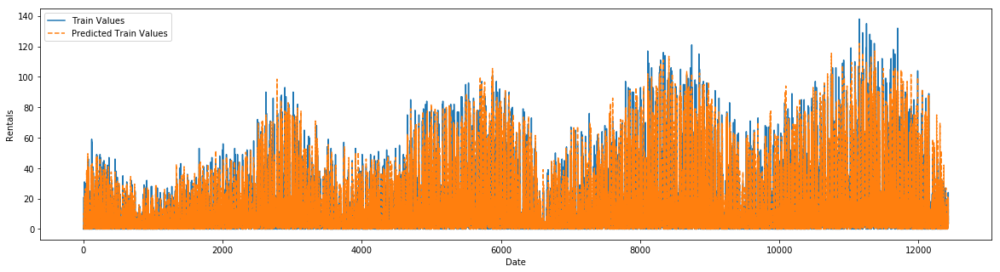

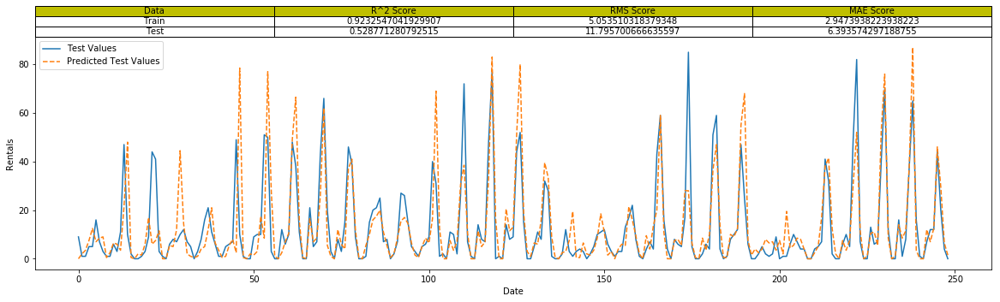

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=3, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.898300649195559', '5.8173656863947905', '3.4445248820248824'], ['Test', '0.5457118753797752', '11.581733297945474', '6.160642570281125']]


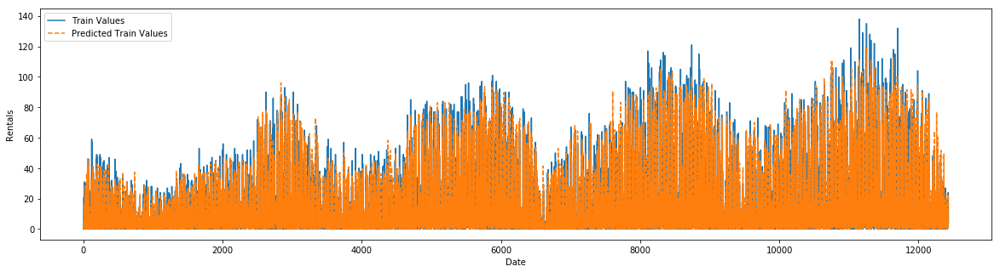

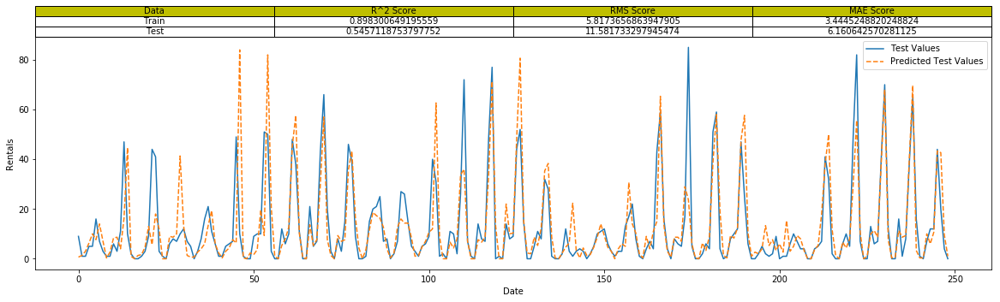

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=4, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8836205606867804', '6.223080298574787', '3.6938746782496783'], ['Test', '0.5537613780968952', '11.478666697688652', '6.219879518072289']]


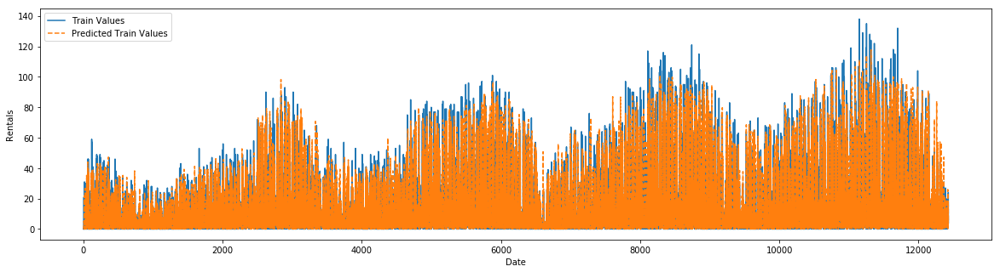

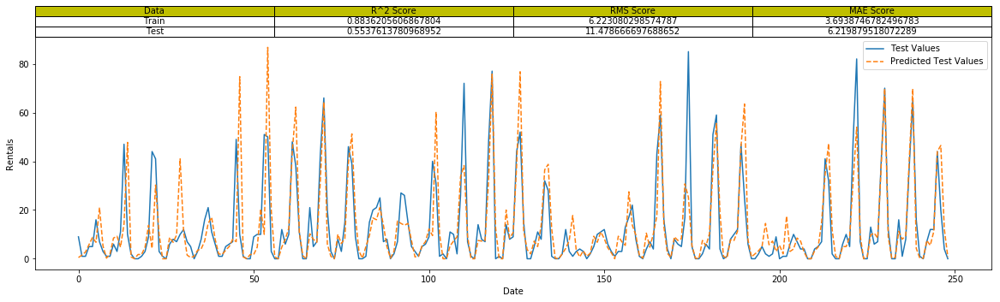

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=5, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9660561605612117', '3.360839376218583', '1.7411036036036036'], ['Test', '0.6499968427177449', '10.165853545731071', '5.3622489959839355']]


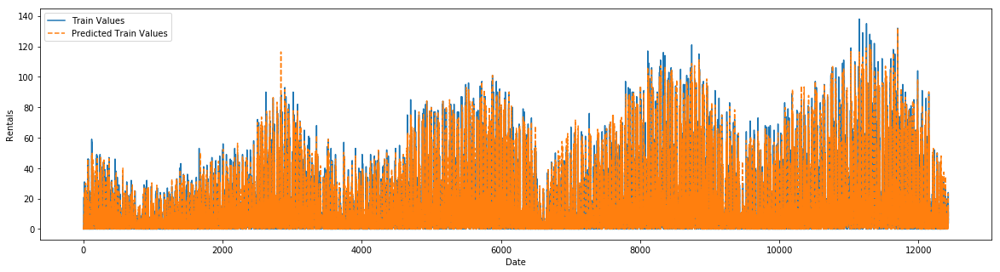

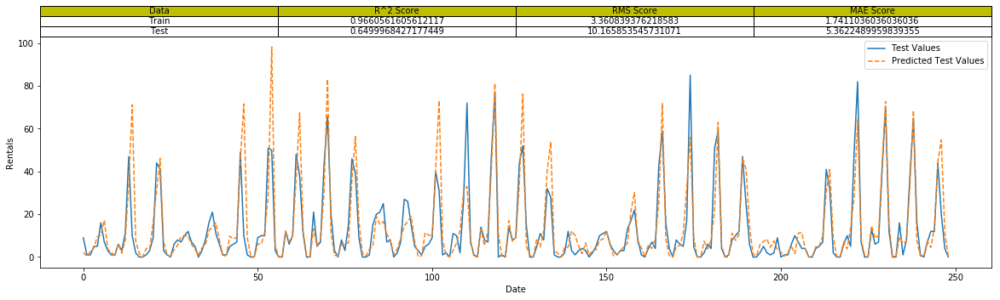

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9755443455078362', '2.852705369982664', '1.5728442728442726'], ['Test', '0.6960150056120965', '9.47401222452885', '5.106425702811245']]


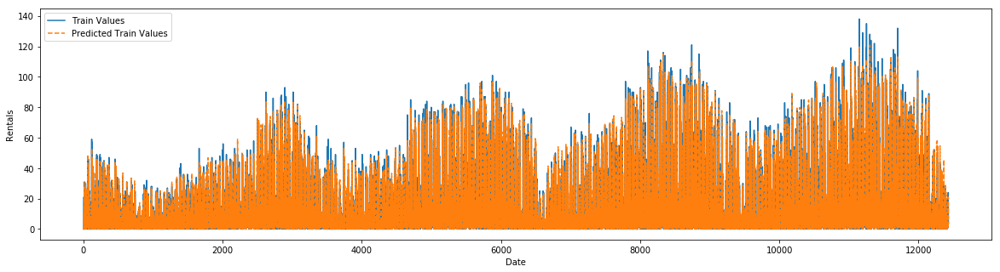

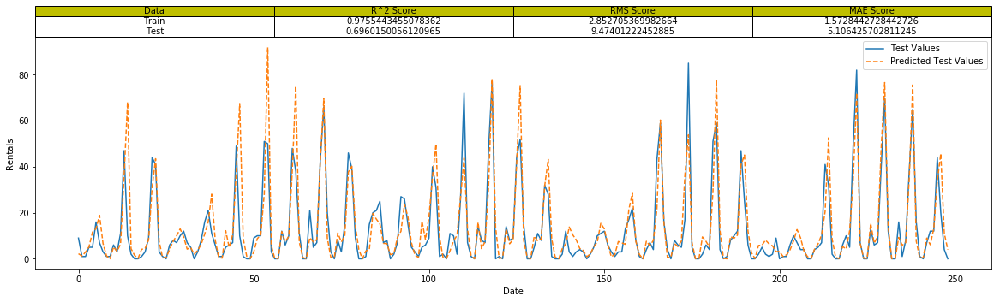

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9817275539293193', '2.4658441204813064', '1.4372924710424708'], ['Test', '0.6933029381515718', '9.516180597944258', '5.18136546184739']]


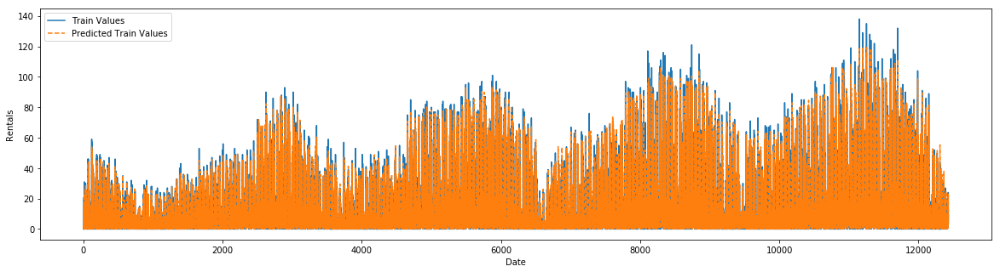

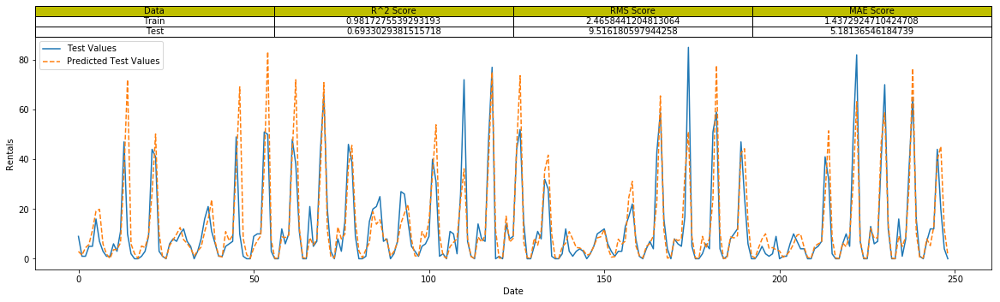

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9825750293191018', '2.407982368338499', '1.4247377734877738'], ['Test', '0.69391223917735', '9.506723218090526', '5.1802409638554225']]


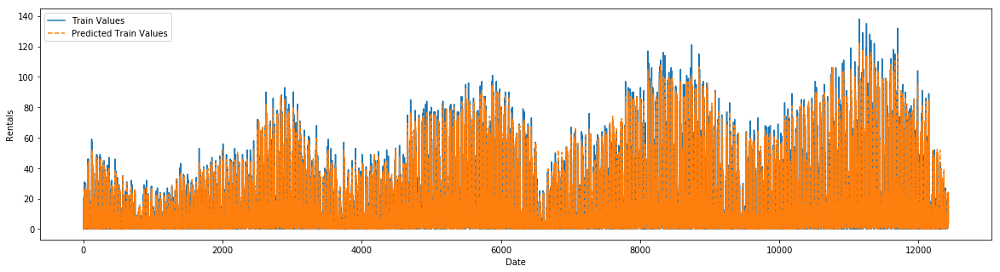

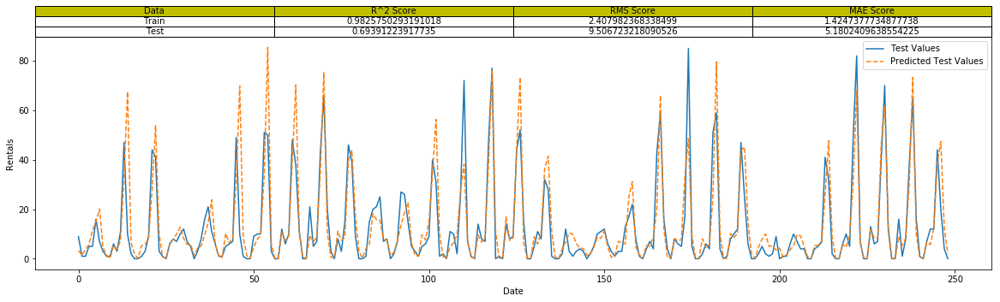

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9831269074601908', '2.369543134043494', '1.4079523809523806'], ['Test', '0.7004476070287002', '9.404685227316202', '5.141204819277108']]


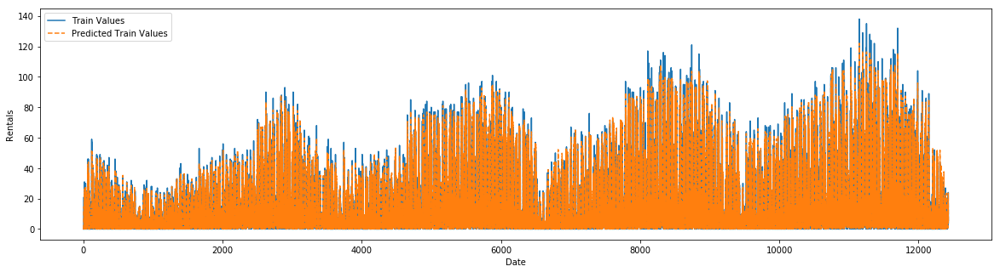

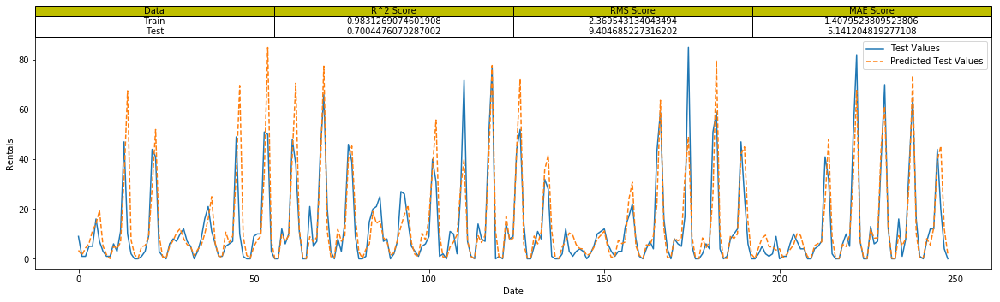

In [24]:
yy = 2020
mm = 1
X_train, X_test, y_train, y_test = tt_split(genMemDataset(grove_dummies, 8),retrieveData(grove_data, yy, mm).index[0], test_days = 31)

for model in models:
    
    modelPerformance(model, X_train, X_test, y_train, y_test)

## Scale Again

We would have to scale the data again as new unscaled features came along

In [23]:
scaler = MinMaxScaler()

In [24]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False) 

Performance and Predictions Trend: 
[['Train', '0.7201852856265807', '9.649449751407948', '6.359048222329473'], ['Test', '0.6770437621285489', '9.765167710176899', '6.744352409638554']]


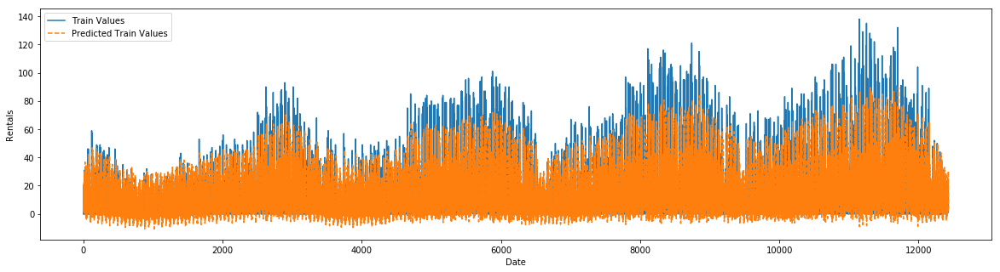

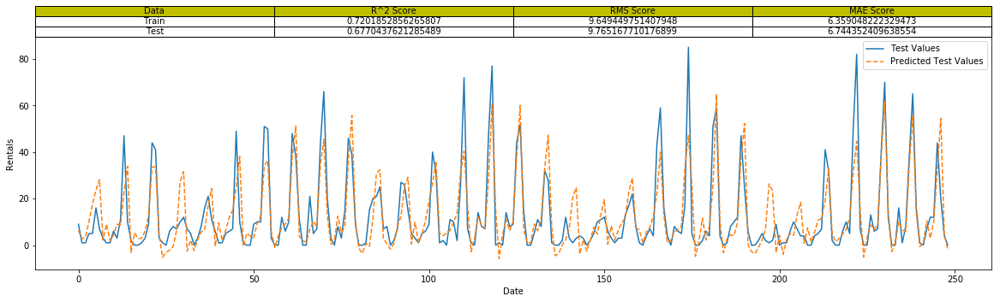

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=1, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '1.0', '0.0', '0.0'], ['Test', '0.6972727308481335', '9.454392744575122', '5.538152610441767']]


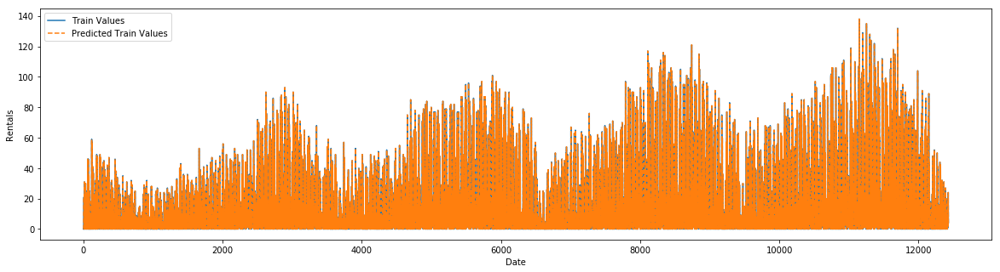

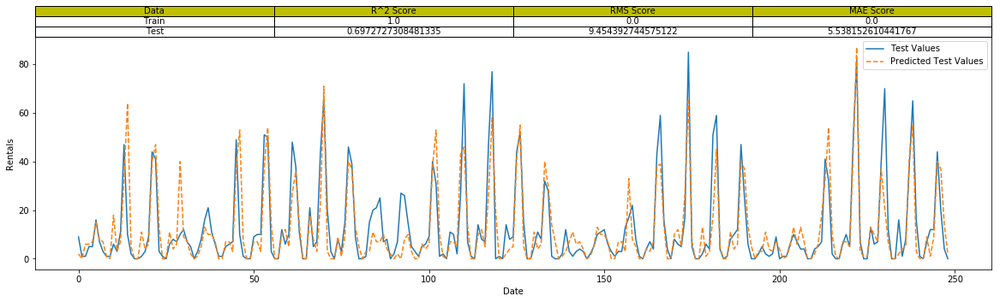

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9430036468137661', '4.355026571102229', '2.508445945945946'], ['Test', '0.7508896107060055', '8.576375508772331', '5.337349397590361']]


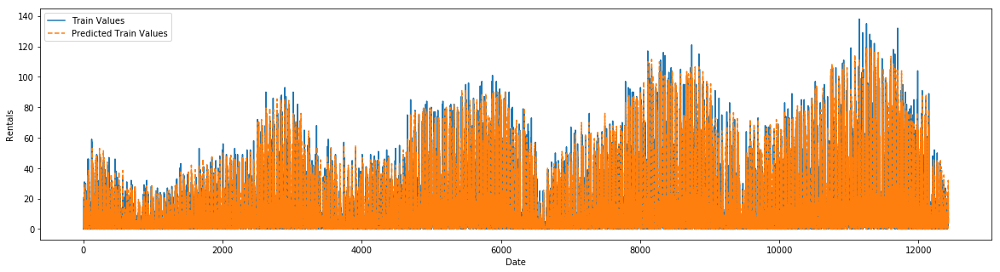

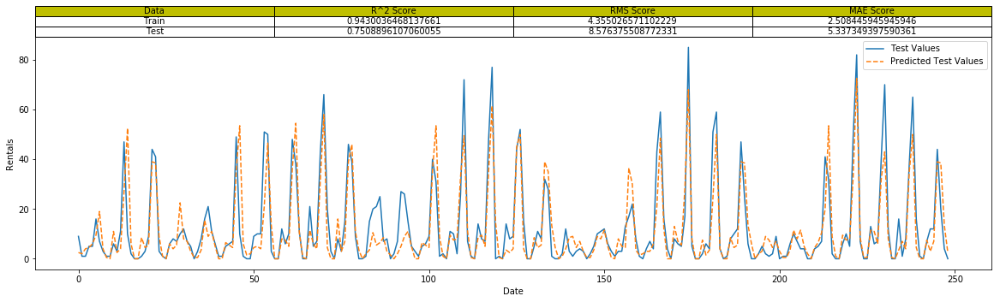

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=3, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9202278842428506', '5.1522013846198895', '3.004155941655942'], ['Test', '0.7205206158149762', '9.084117782959988', '5.448460508701472']]


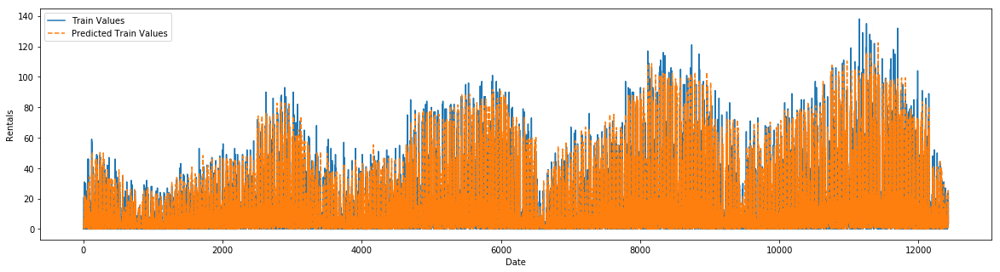

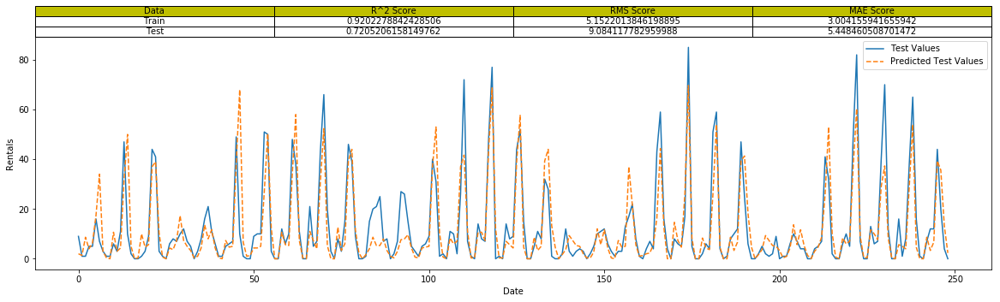

Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=4, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9046372384782075', '5.633219630810133', '3.291525900900901'], ['Test', '0.723741134755647', '9.031626715298746', '5.427710843373494']]


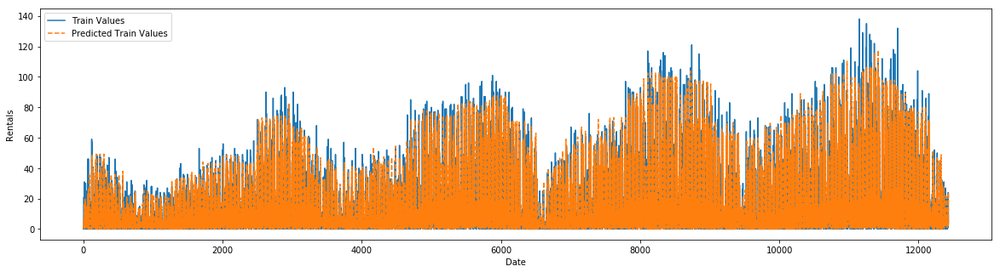

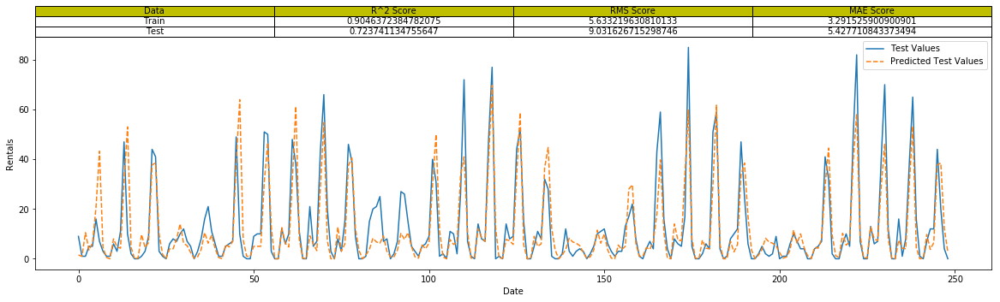

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=5, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9673569881038458', '3.2958116629101424', '1.7215250965250966'], ['Test', '0.7080532328713067', '9.284525278039489', '5.249799196787149']]


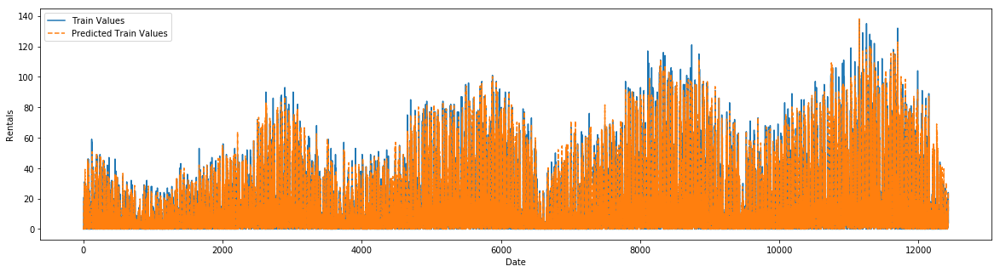

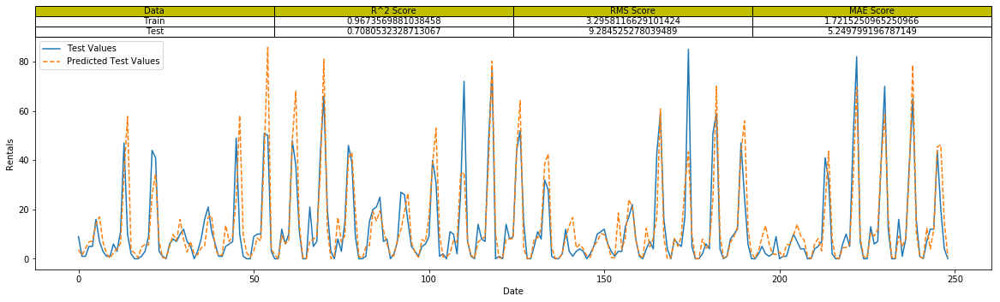

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9756755474562726', '2.8450428507131176', '1.5895189832689833'], ['Test', '0.6975201410573204', '9.450528554522194', '5.039759036144579']]


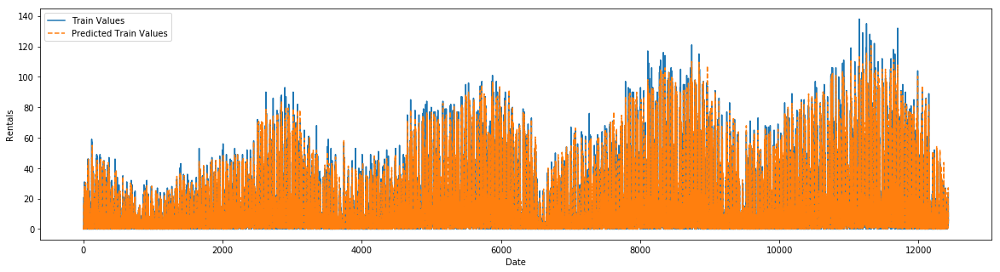

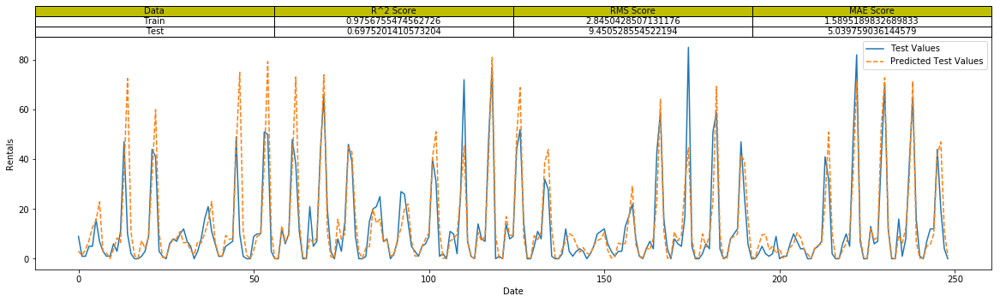

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9817170880376151', '2.4665501989965426', '1.4430598455598456'], ['Test', '0.6951197805372011', '9.487952284566827', '5.131807228915663']]


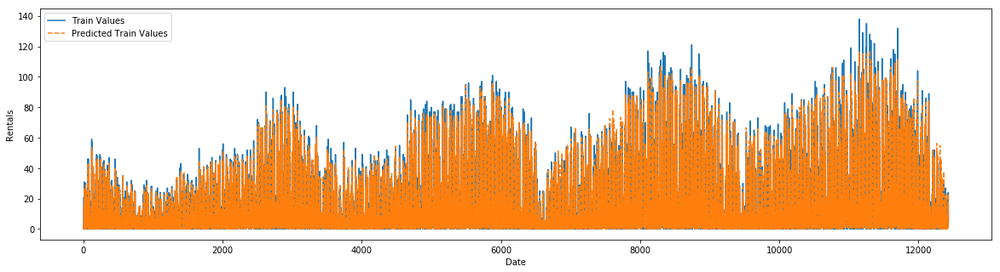

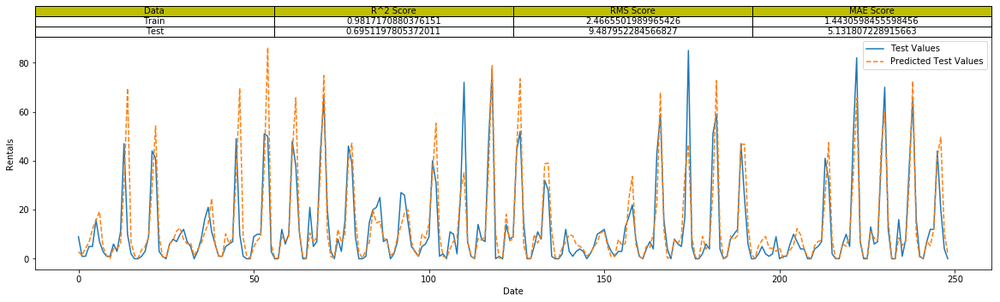

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9825898192888025', '2.4069602275486996', '1.4153885135135136'], ['Test', '0.7036287344858907', '9.354614929644496', '5.137871485943775']]


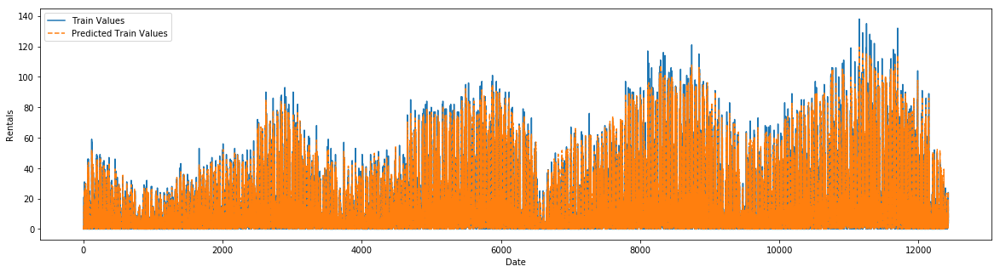

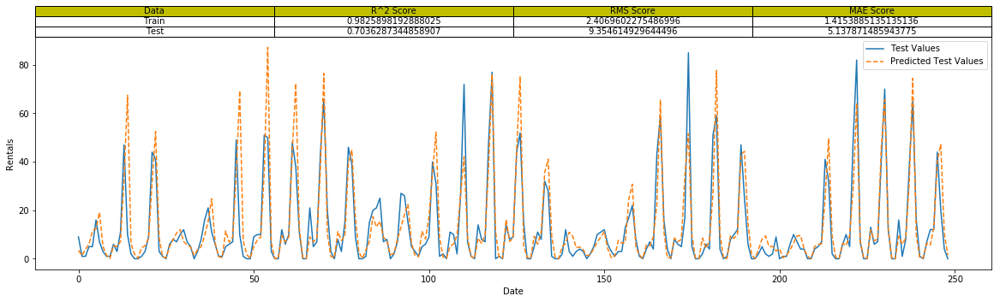

Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9831222077835304', '2.369873106489521', '1.4075461711711712'], ['Test', '0.6972335683826913', '9.455004260934905', '5.161767068273093']]


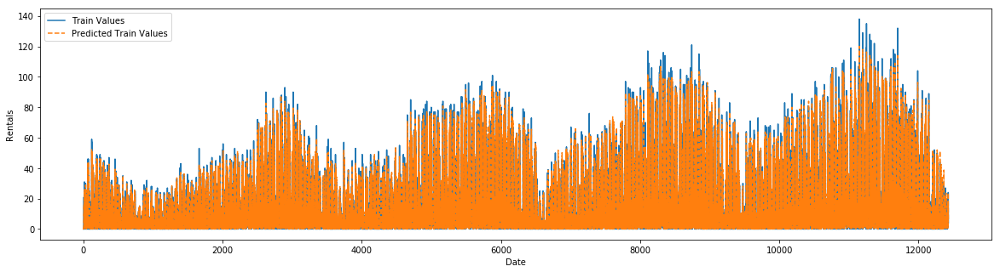

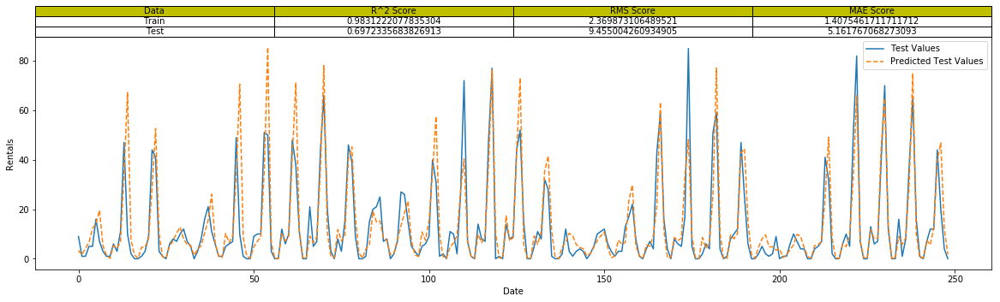

In [27]:
for model in models:
    modelPerformance(model, X_train_scaled, X_test_scaled, y_train, y_test)

## Test Data of lesser Days

In [25]:
memory_dataset = genMemDataset(grove_dummies, 8)

In [26]:
model = KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

## Custom Performance

- This function will take the data, model, date params and most imp Number of testing days
- Calculate the splitting index 
- Use tt_split to split the data
- Scale it
- Show the performance

In [27]:
def customPerformance(data, model, td, yy, mm, dd = None):
    yy = yy
    mm = mm
    dd = dd
    td = td
    spidx = retrieveData(grove_data, yy, mm, dd).index[0]
    print(spidx)
    X_train, X_test, y_train, y_test = tt_split(data, spidx, test_days = td)

    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    fitted_model = modelPerformance(model,X_train,X_test,y_train,y_test)
    return fitted_model

#### Test for Jan

###### Test from 1 jan +7 days

12432


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9430036468137661', '4.355026571102229', '2.508445945945946'], ['Test', '0.4025976579495179', '10.482441459286497', '5.517543859649122']]


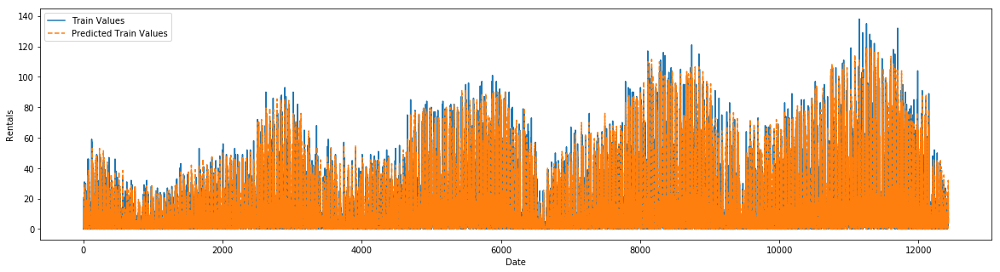

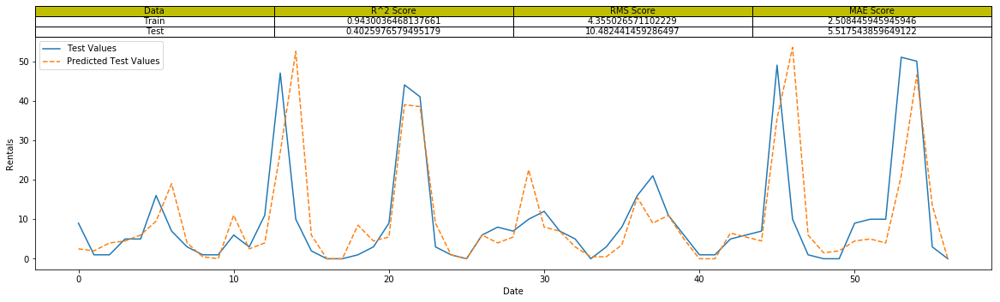

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [28]:
customPerformance(memory_dataset, model, 7, 2020, 1)

###### Test from 15 jan +7 days

12544


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9421214326996645', '4.383078365330998', '2.520886479591837'], ['Test', '0.7821430122470251', '7.6597031686338175', '4.62280701754386']]


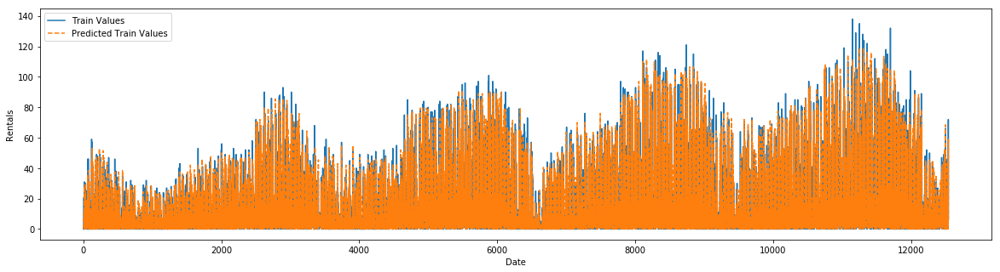

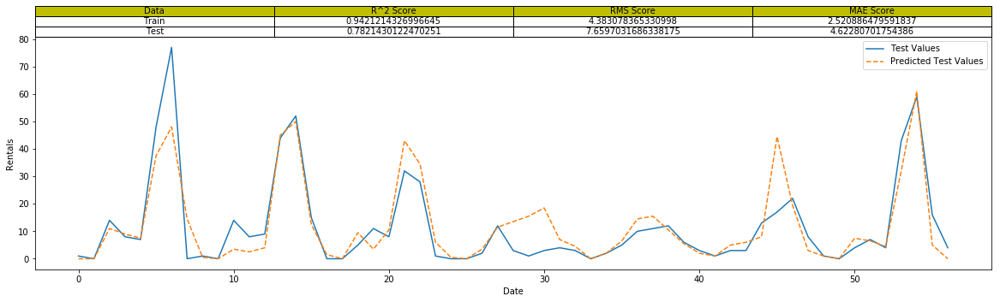

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [29]:
customPerformance(memory_dataset, model, 7, 2020, 1, 15)

##### Test for Feb

12680


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9418370469929173', '4.394598957811737', '2.528627760252366'], ['Test', '0.8147912416112004', '7.612316889164076', '4.368421052631579']]


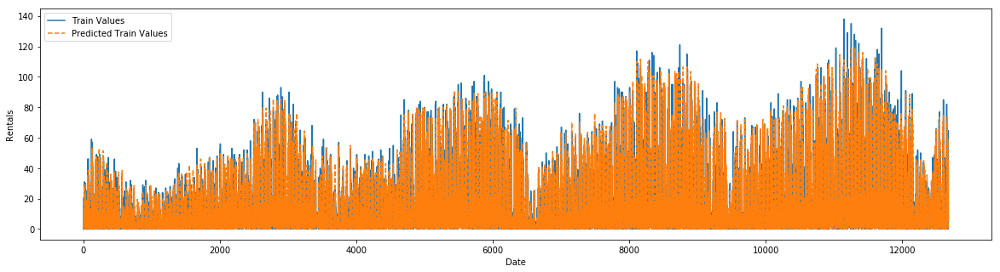

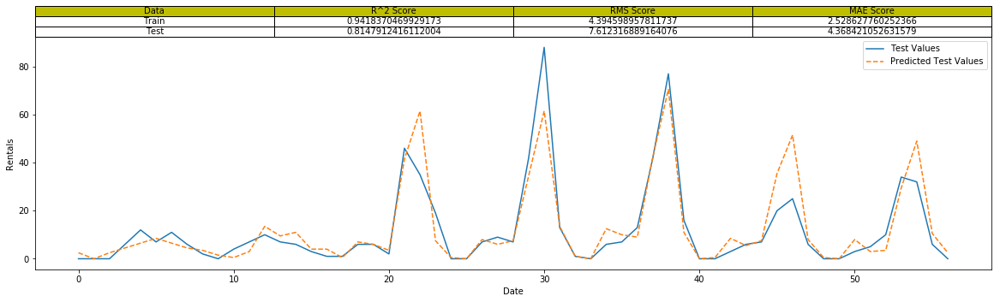

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [30]:
customPerformance(memory_dataset, model, 7, 2020, 2)

##### Test for March

12912


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9413934060039577', '4.3956430143147065', '2.5275712515489466'], ['Test', '-1.1866894390738185', '12.355550920708346', '6.716867469879518']]


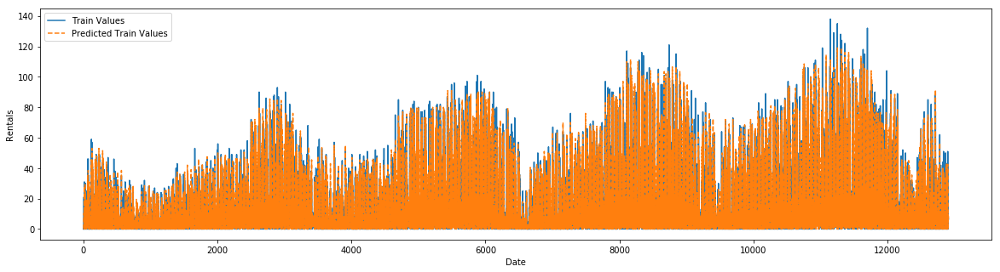

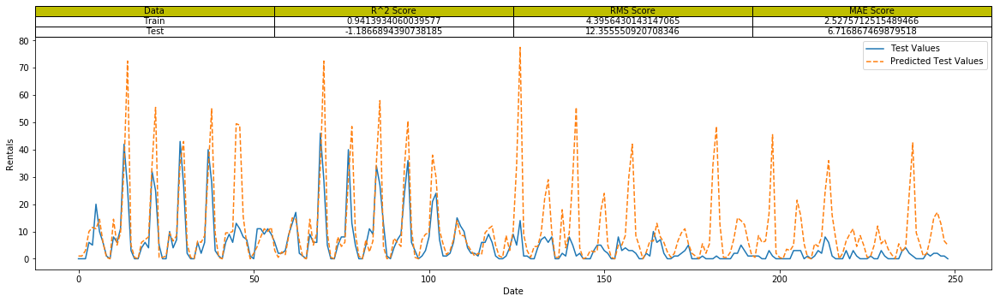

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [31]:
customPerformance(memory_dataset, model, 31, 2020, 3)

##### Test for June 2019

10720


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9408790220338795', '4.132266891692634', '2.387453358208955'], ['Test', '0.887912655819907', '8.206912553123646', '5.341365461847389']]


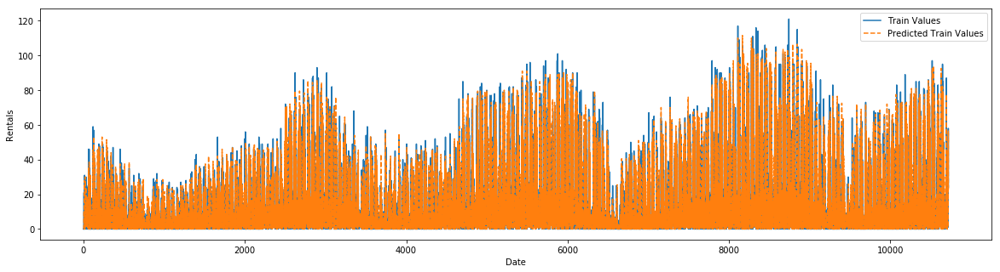

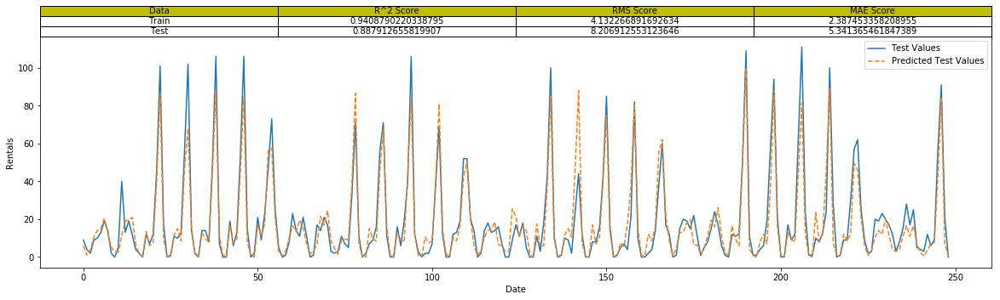

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [32]:
customPerformance(memory_dataset, model, 31, 2019, 6)

### Holidays inclusion

Another feature Engineering we can do is include Holidays. I saw above that models are weak in months of December and January, So We can make a binary feature of Holidays. But these are just Federal Holidays so not much can be expected. 

In [33]:
holidays = pd.read_csv(dp.data_avenue+"usholidays.csv")

In [34]:
holidays.head()

,Unnamed: 0,Date,Holiday
0,0,2010-12-31,New Year's Day
1,1,2011-01-17,"Birthday of Martin Luther King, Jr."
2,2,2011-02-21,Washington's Birthday
3,3,2011-05-30,Memorial Day
4,4,2011-07-04,Independence Day


In [35]:
holidays = holidays['Date'].values

In [36]:
grove_holidays = []
for j in range(grove_data.shape[0]):
    i=0
    date = str()
    for el in grove_data.iloc[j,[0,1,2]].values:
        date = date+str(el)
        if i<2:
            date = date+'-'
        i=i+1
    date = str(pd.to_datetime([date])[0])[:10]
    if date in holidays:
        h = 1
    else:
        h = 0
    grove_holidays.append(h)
grove_holidays = np.array(grove_holidays)

In [37]:
grove_holidays = pd.concat([grove_data,pd.Series(grove_holidays, name = "Holiday")], axis = 1)

In [38]:
grove_holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13648 entries, 0 to 13647
Data columns (total 7 columns):
YY          13648 non-null int64
MM          13648 non-null object
DD          13648 non-null object
Day         13648 non-null object
HH          13648 non-null object
Bookings    13648 non-null int64
Holiday     13648 non-null int32
dtypes: int32(1), int64(2), object(4)
memory usage: 693.1+ KB


In [39]:
grove_holidays_dummies = pd.get_dummies(grove_holidays)

In [40]:
grove_holidays_dummies.columns

Index(['YY', 'Bookings', 'Holiday', 'MM_1', 'MM_2', 'MM_3', 'MM_4', 'MM_5',
       'MM_6', 'MM_7', 'MM_8', 'MM_9', 'MM_10', 'MM_11', 'MM_12', 'DD_1',
       'DD_2', 'DD_3', 'DD_4', 'DD_5', 'DD_6', 'DD_7', 'DD_8', 'DD_9', 'DD_10',
       'DD_11', 'DD_12', 'DD_13', 'DD_14', 'DD_15', 'DD_16', 'DD_17', 'DD_18',
       'DD_19', 'DD_20', 'DD_21', 'DD_22', 'DD_23', 'DD_24', 'DD_25', 'DD_26',
       'DD_27', 'DD_28', 'DD_29', 'DD_30', 'DD_31', 'Day_0', 'Day_1', 'Day_2',
       'Day_3', 'Day_4', 'Day_5', 'Day_6', 'HH_0-3', 'HH_12-15', 'HH_15-18',
       'HH_18-21', 'HH_21-24', 'HH_3-6', 'HH_6-9', 'HH_9-12'],
      dtype='object')

In [41]:
memory_dataset_holidays = genMemDataset(grove_holidays_dummies, 8)

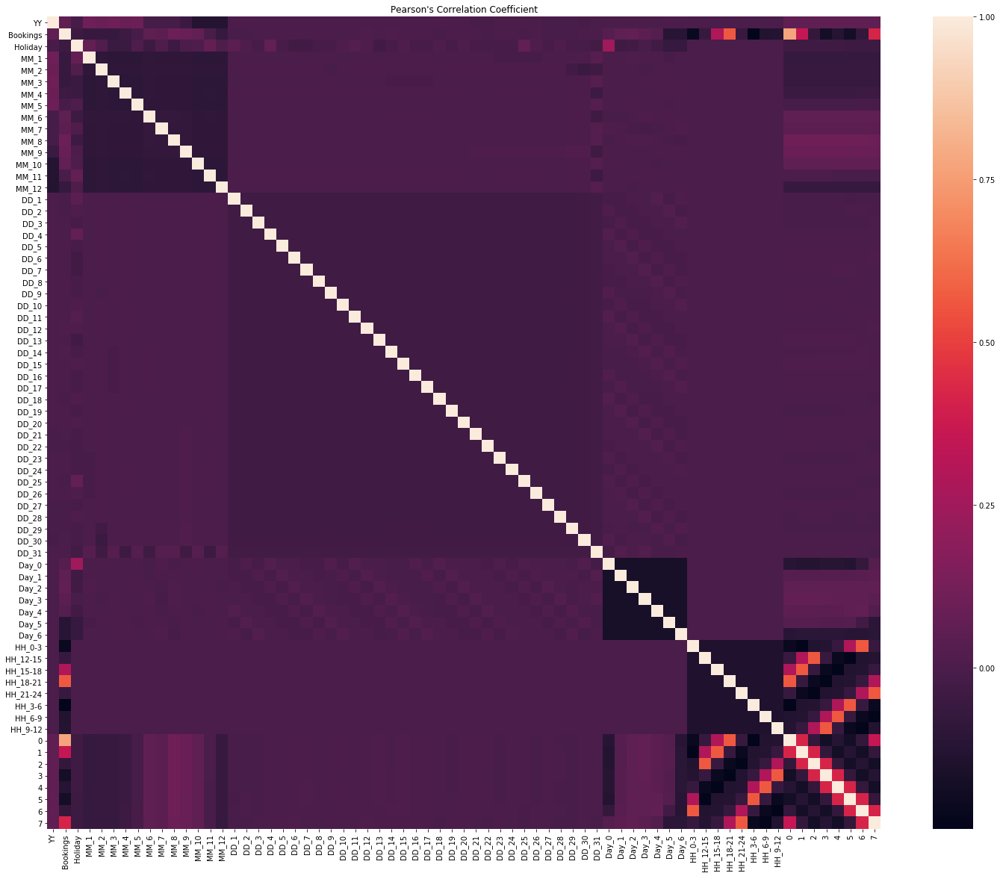

In [42]:
plt.figure(figsize=(25,20))
plt.title("Pearson's Correlation Coefficient")
sns.heatmap(memory_dataset_holidays.corr(), annot=False)
plt.show()

##### Test again for June 2019

10720


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.9401957665493359', '4.156076404746375', '2.397248134328358'], ['Test', '0.887912655819907', '8.206912553123646', '5.341365461847389']]


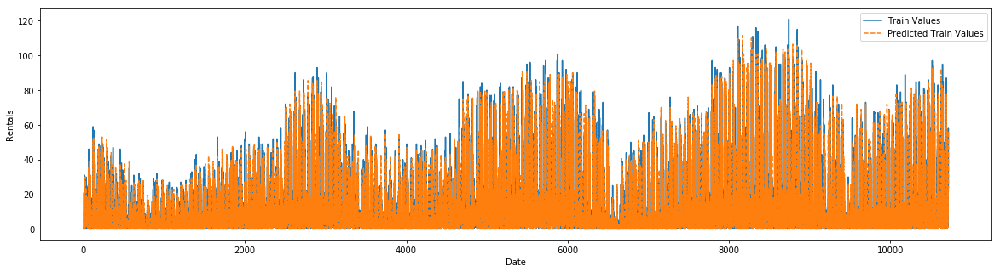

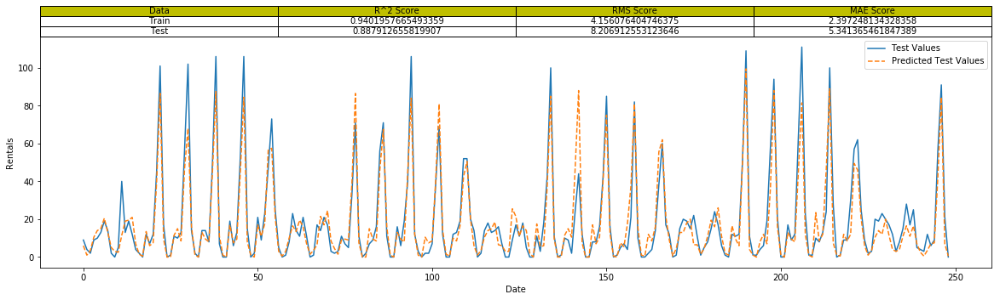

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=2, p=2,
          weights='uniform')

In [43]:
customPerformance(memory_dataset_holidays, model, 31, 2019, 6)

10720


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False) 

Performance and Predictions Trend: 
[['Train', '0.9817173874102353', '2.2979294297647836', '1.3616548507462687'], ['Test', '0.8757094979363585', '8.64212388368065', '5.626265060240964']]


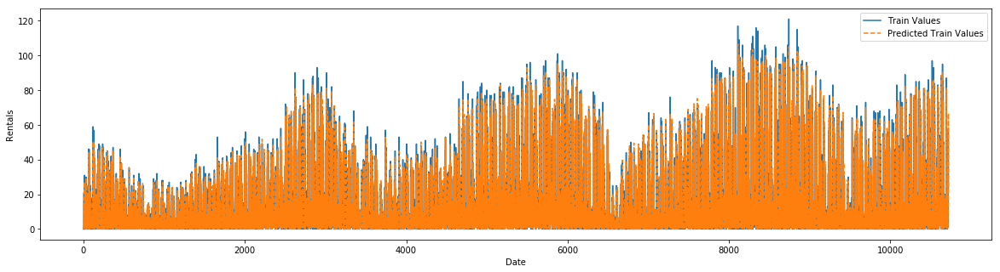

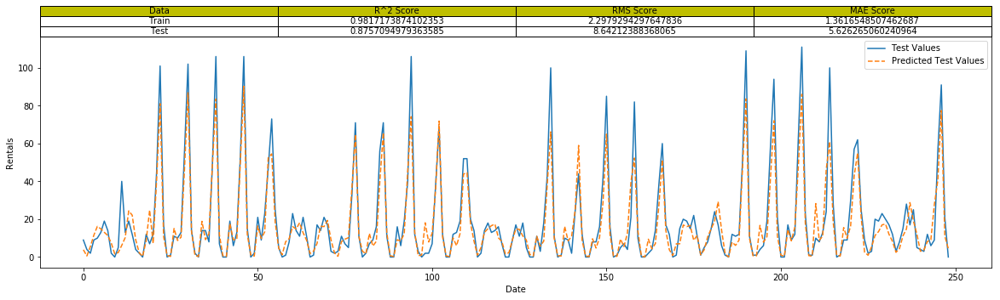

In [44]:
fitted_model = customPerformance(memory_dataset_holidays, RandomForestRegressor(n_estimators=50),31, 2019, 6)

## Feature Importance(s)

Now Lets have a little Data Insight Mining, As we can see below features named '0' and '7' has a really high role in deciding bookings. So what are they?
- '0' is Number of Bookings in the same time slot yesterday.
- '1' is Number of Bookings in the previous time slot.

Again these make sense and cannot be ignored and this is how I have engineered feature which is even more important than any existing default one.

[]

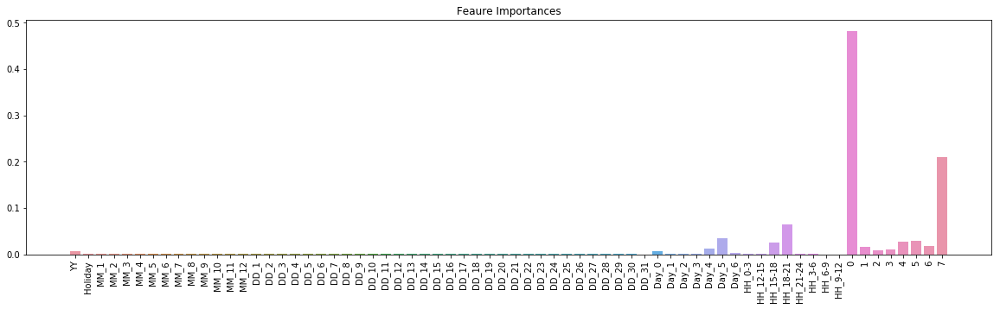

In [45]:
plt.figure(figsize=(20,5))
plt.title("Feaure Importances")
sns.barplot(memory_dataset_holidays.drop(columns = ['Bookings'
                                               ]).columns.astype(str).values,fitted_model.feature_importances_)
plt.xticks(rotation=90)
plt.plot()

10720


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8911721645398968', '5.606444852185475', '3.3227985074626867'], ['Test', '0.9000656054191364', '7.676520217885292', '5.066390041493776']]


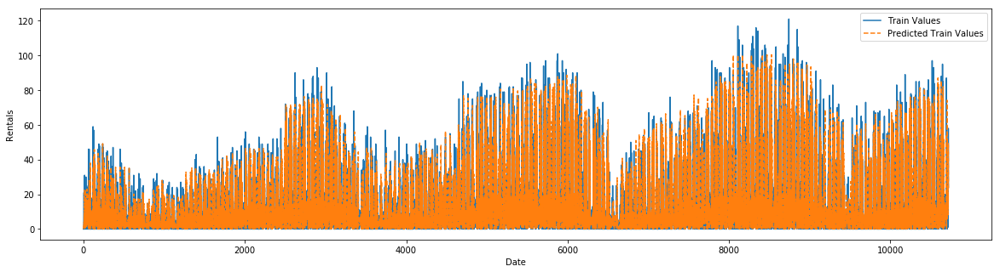

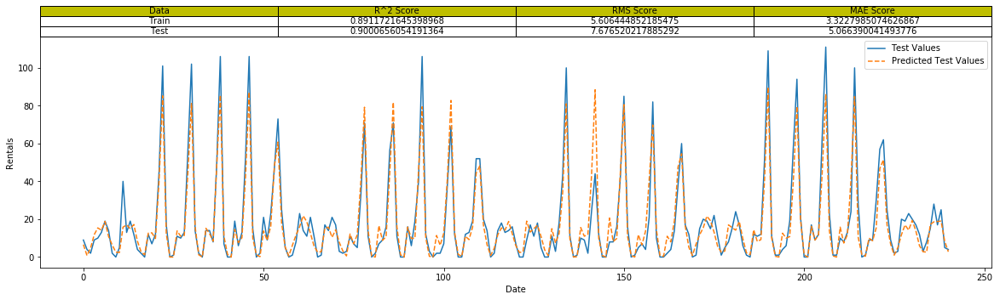

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform')

In [62]:
customPerformance(memory_dataset_holidays, KNeighborsRegressor(n_neighbors = 5), 30, 2019, 6)

10720


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.4280584642501299', '12.85267060929536', '7.178059701492538'], ['Test', '0.8884581435954335', '8.110093091852042', '5.178423236514523']]


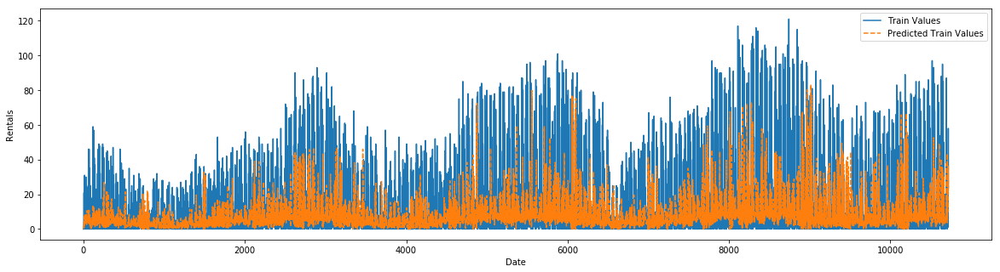

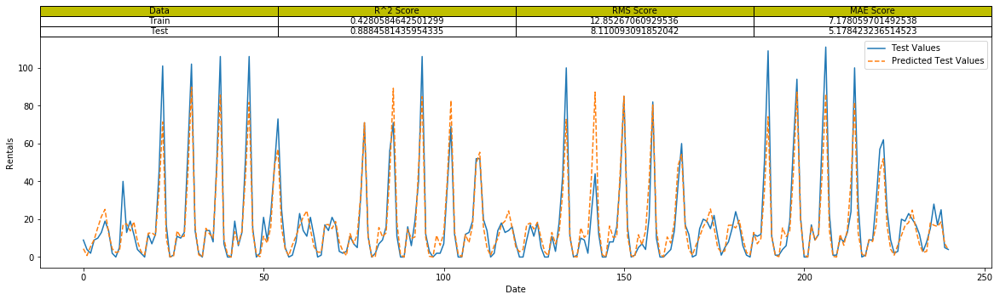

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform')

In [63]:
customPerformance(grove_holidays_dummies, KNeighborsRegressor(n_neighbors = 5), 30, 2019, 6)

## Generating Monthly Predictions

In [101]:
def genPredictions(data, model, yy, mm, dd = None):
    yy = yy
    mm = mm
    dd = dd
    
    if mm in [1,3,5,7,8,10,12]:
        td = 31
    elif mm in [4,6,9,11]:
        td = 30
    else:
        if yy%4 == 0:
            td = 29
        else:
            td = 28
            
    spidx = retrieveData(grove_data, yy, mm, dd).index[0]
    print("Test Data taking from:", str(yy) + '-' + str(mm), "for",td, "days | Split at index:", spidx)
    X_train, X_test, y_train, y_test = tt_split(data, spidx, test_days = td)

    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    fitted_model, predictions = modelPerformance(model,X_train,X_test,y_train,y_test)
    return predictions, y_test

Test Data taking from: 2020-1 for 31 days | Split at index: 12432


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8923785880686309', '5.984344924040071', '3.526045688545689'], ['Test', '0.7698326094162173', '8.243843997518493', '5.141365461847389']]


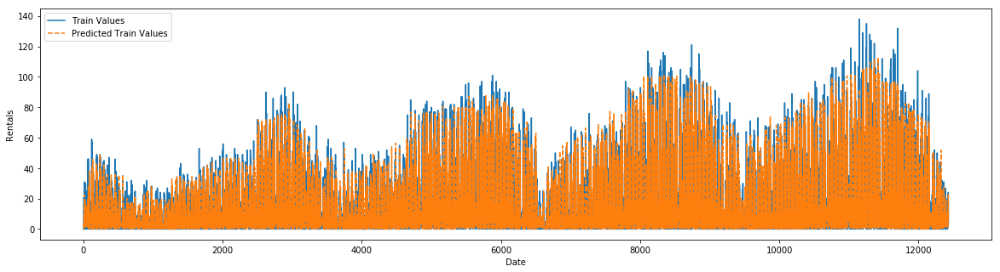

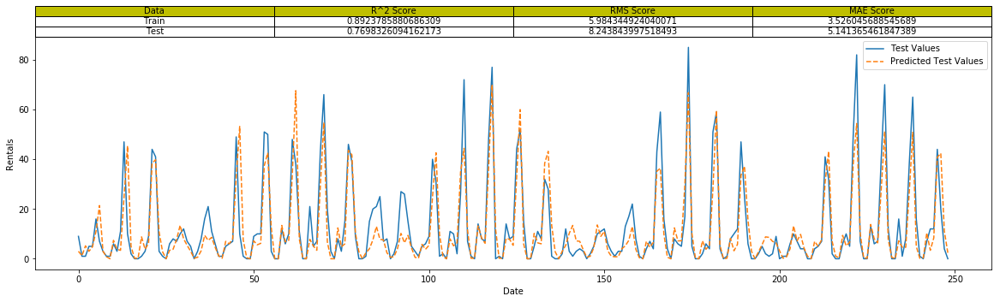

In [102]:
preds, true = genPredictions(memory_dataset_holidays, KNeighborsRegressor(n_neighbors = 5), 2020, 1)

## Generate Timeline Forecast from start to end YY-MM 

In [138]:
def timeline_forecast(yy_start, mm_start, yy_end, mm_end):
    yy = yy_start
    mm = mm_start
    
    forecasts = np.array([])
    true_vals = np.array([])
    
    while True:
        preds, true = genPredictions(memory_dataset_holidays, KNeighborsRegressor(n_neighbors = 5), yy, mm)

        mm = mm + 1
        
        if mm == 13:
            mm = 1
            yy = yy + 1
            
        forecasts = np.append(forecasts, preds)
        true_vals = np.append(true_vals, true)
        
        if yy>=yy_end and mm>mm_end:
            break
            
            
    return forecasts, true_vals

Test Data taking from: 2019-1 for 31 days | Split at index: 9512


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8857407942465719', '5.671294264760957', '3.359146341463415'], ['Test', '0.7698029617298333', '7.277064150507567', '4.216064257028112']]


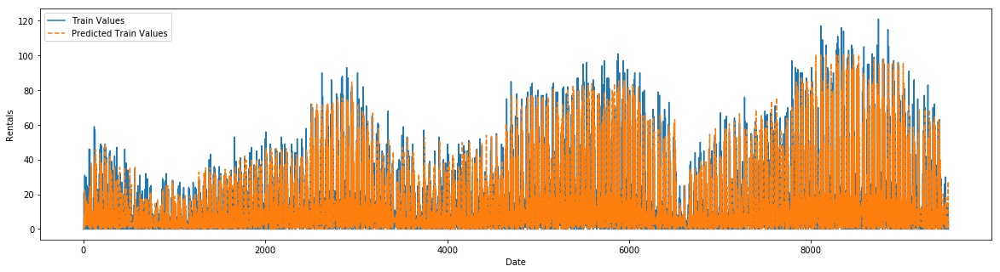

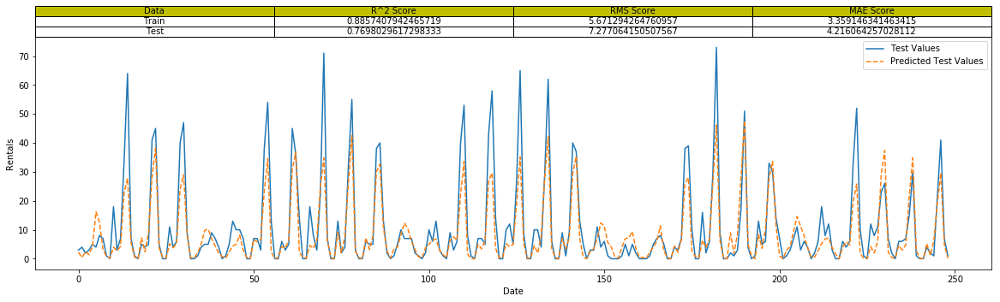

Test Data taking from: 2019-2 for 28 days | Split at index: 9760


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8913005266575104', '5.519111356362945', '3.2793032786885243'], ['Test', '0.7820967698936973', '7.343447570604846', '3.8159999999999994']]


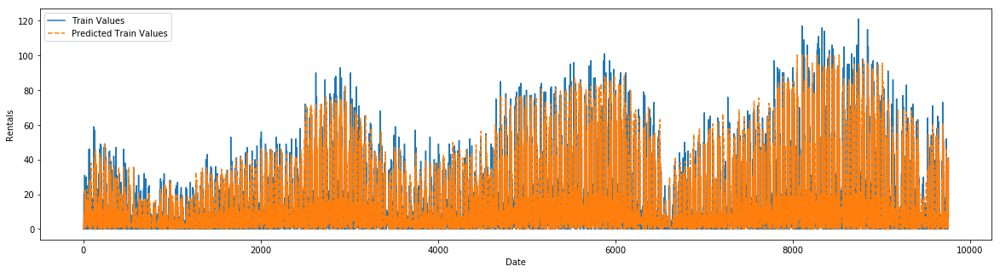

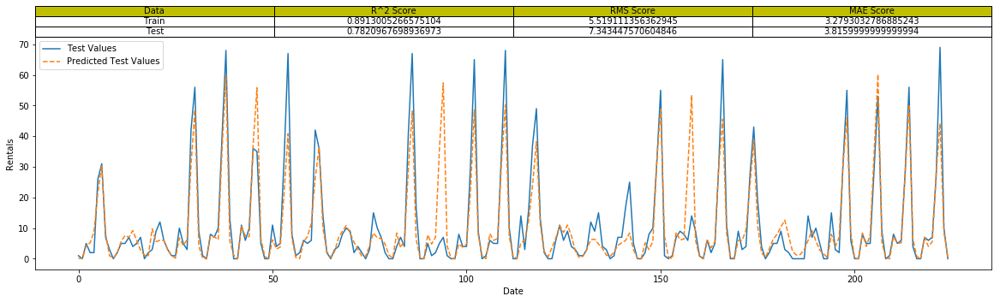

Test Data taking from: 2019-3 for 31 days | Split at index: 9984


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8894613583303859', '5.558563862324373', '3.290845352564103'], ['Test', '0.843002959201599', '7.088584635067431', '4.29718875502008']]


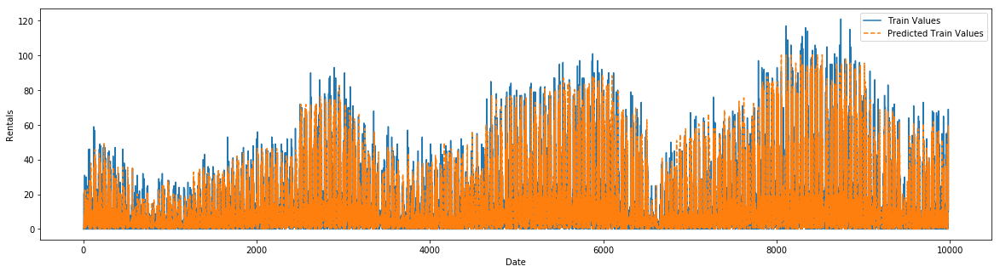

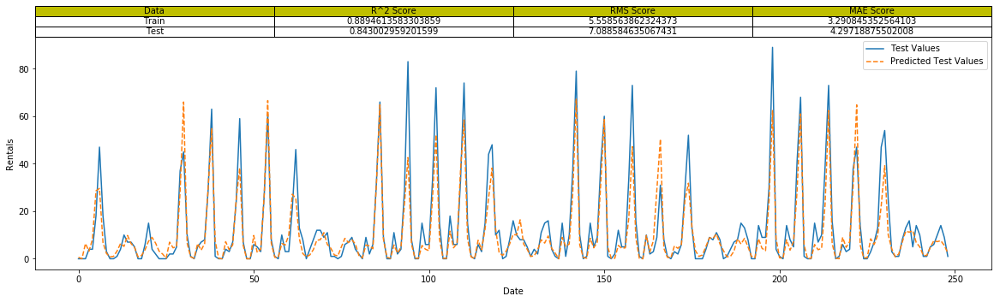

Test Data taking from: 2019-4 for 30 days | Split at index: 10232


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8900554256152868', '5.553700806715123', '3.2888780297107116'], ['Test', '0.8569256412304425', '7.770900074431854', '4.852282157676349']]


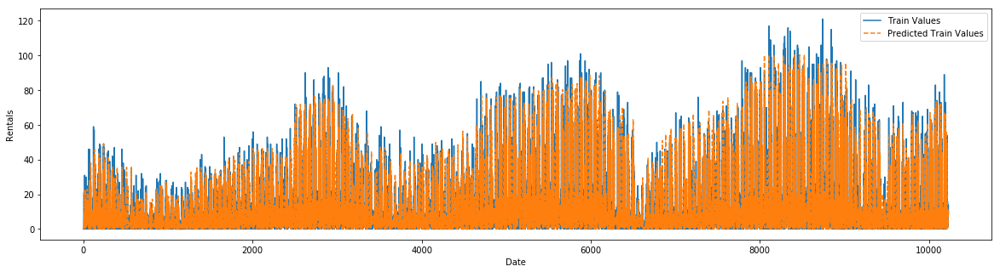

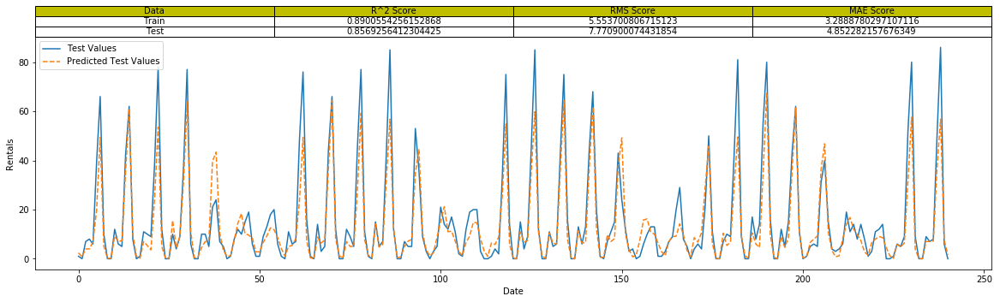

Test Data taking from: 2019-5 for 31 days | Split at index: 10472


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8921850007457514', '5.534725779801672', '3.286344537815127'], ['Test', '0.810637367359402', '9.363742772783725', '5.70441767068273']]


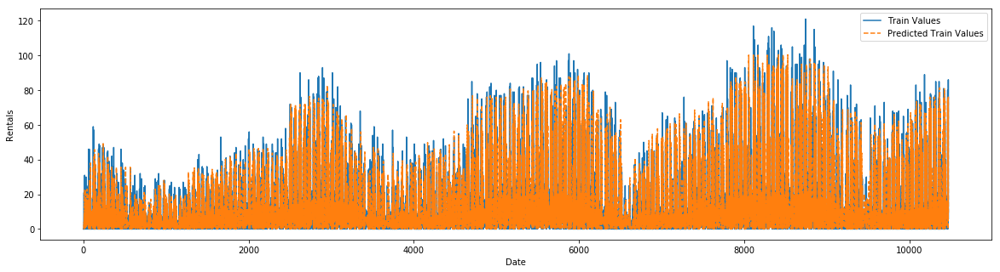

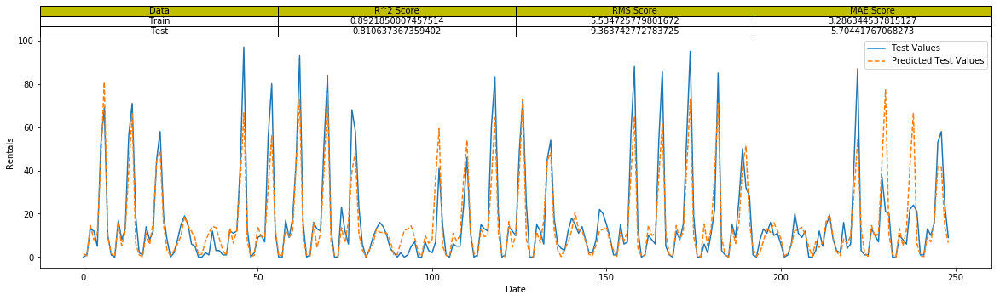

Test Data taking from: 2019-6 for 30 days | Split at index: 10720


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8911721645398968', '5.606444852185475', '3.3227985074626867'], ['Test', '0.9000656054191364', '7.676520217885292', '5.066390041493776']]


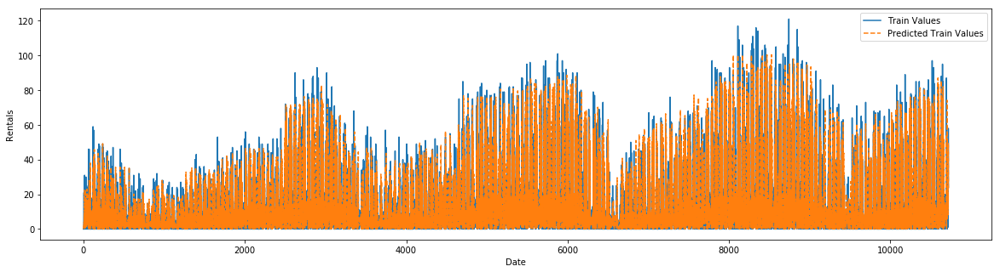

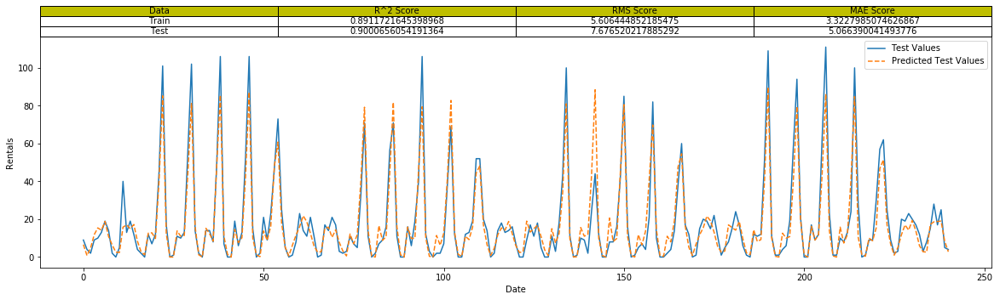

Test Data taking from: 2019-7 for 31 days | Split at index: 10960


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.892856808331494', '5.635839434493043', '3.35043795620438'], ['Test', '0.8385865450094355', '10.161673011545604', '5.976706827309236']]


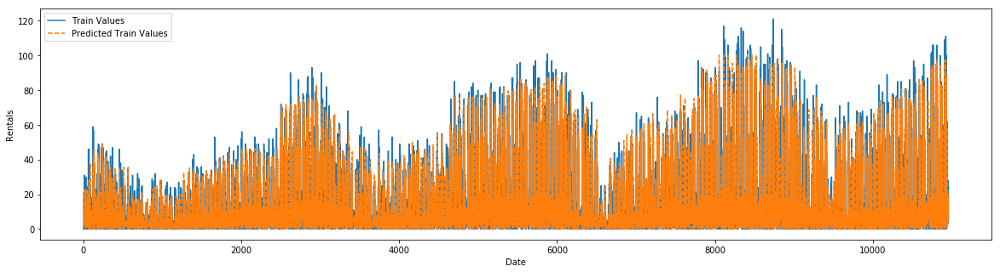

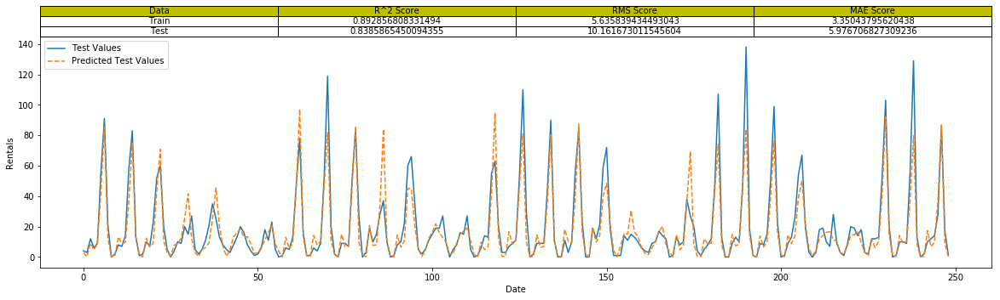

Test Data taking from: 2019-8 for 31 days | Split at index: 11208


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8916510357213385', '5.751157907184966', '3.406245538900785'], ['Test', '0.8669222158490673', '10.30494870785323', '6.296385542168675']]


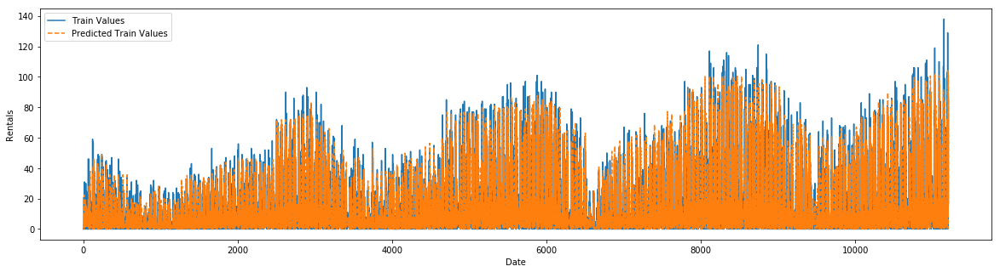

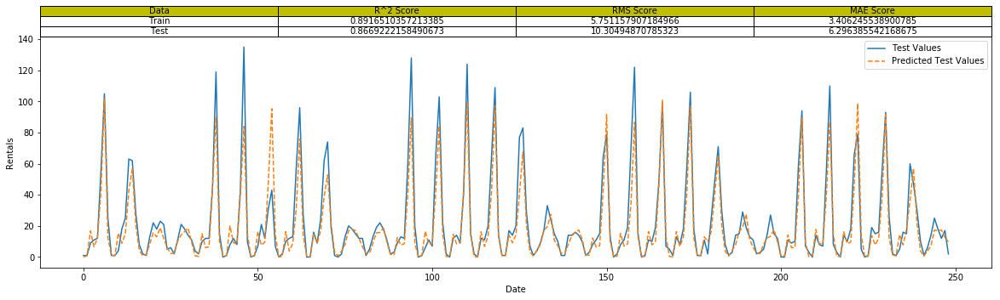

Test Data taking from: 2019-9 for 30 days | Split at index: 11456


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.894595674481893', '5.789626330316382', '3.426588687150838'], ['Test', '0.8384844842856878', '10.94044231319277', '6.949377593360996']]


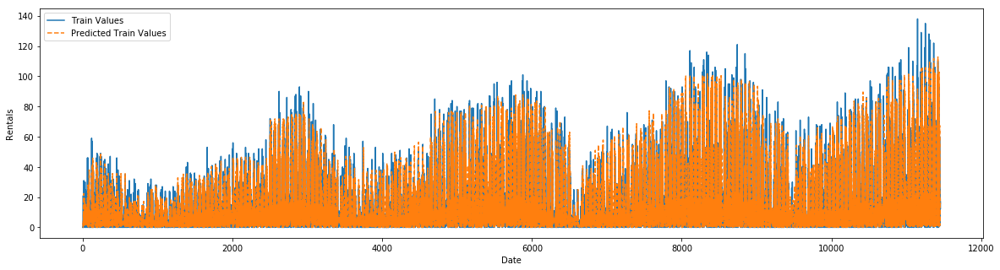

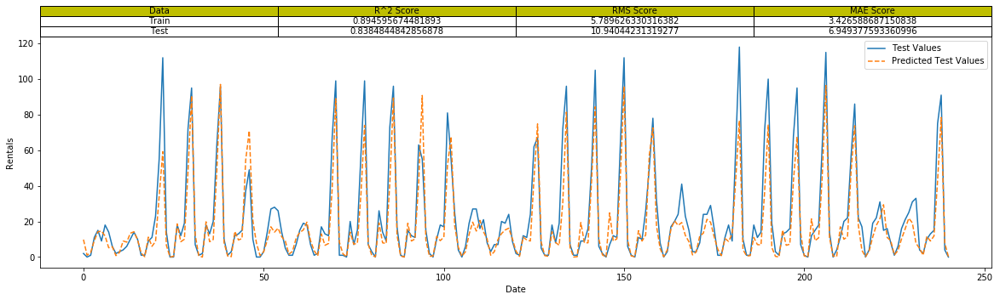

Test Data taking from: 2019-10 for 31 days | Split at index: 11696


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8956234965237805', '5.856096651273448', '3.4573358413132693'], ['Test', '0.7913833334030927', '11.270069113866397', '7.041767068273092']]


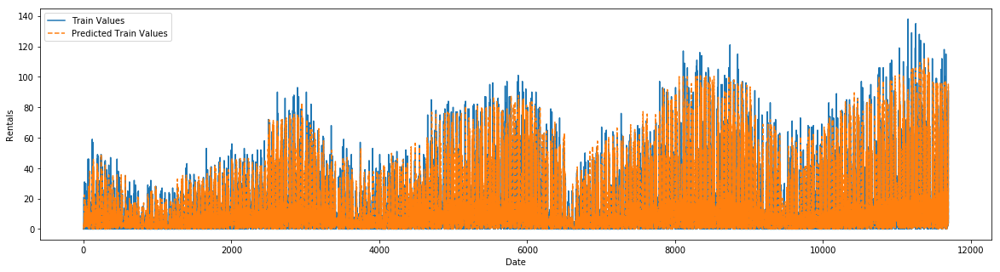

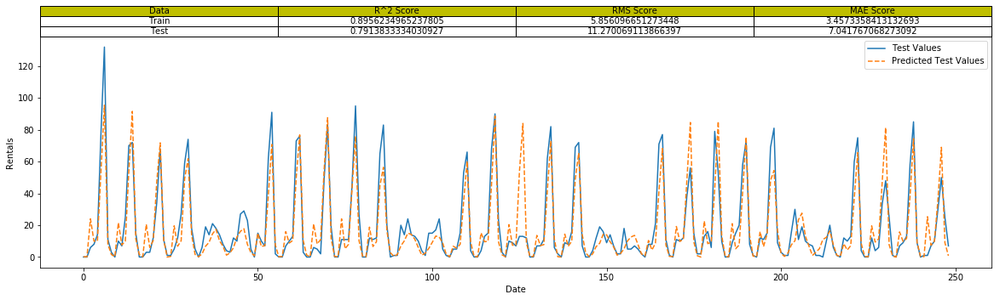

Test Data taking from: 2019-11 for 30 days | Split at index: 11944


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8943500540514399', '5.951039072424842', '3.503030810448761'], ['Test', '0.814069603019018', '8.671123441788762', '5.249792531120331']]


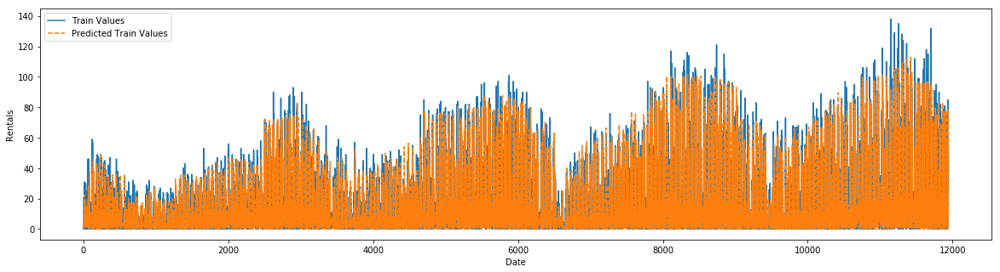

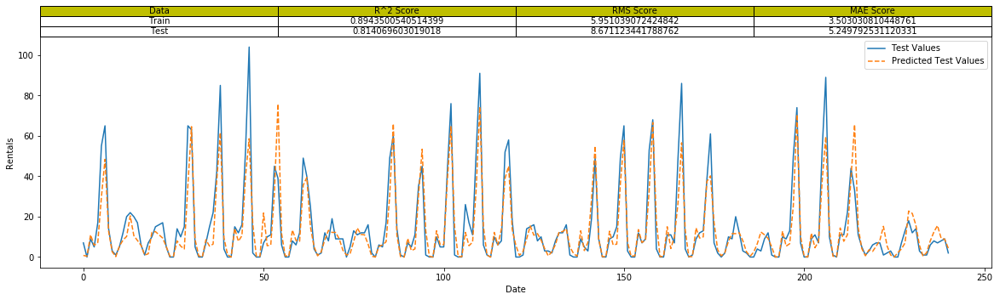

Test Data taking from: 2019-12 for 31 days | Split at index: 12184


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8930720016265974', '6.00008015923692', '3.524901510177281'], ['Test', '0.4742630120091975', '8.144636296459556', '5.137349397590362']]


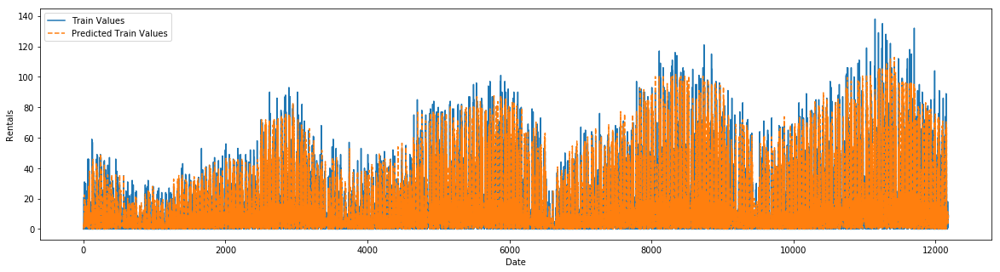

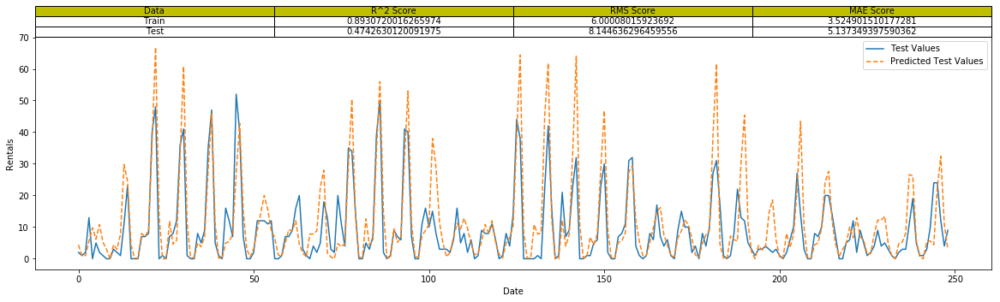

Test Data taking from: 2020-1 for 31 days | Split at index: 12432


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8923785880686309', '5.984344924040071', '3.526045688545689'], ['Test', '0.7698326094162173', '8.243843997518493', '5.141365461847389']]


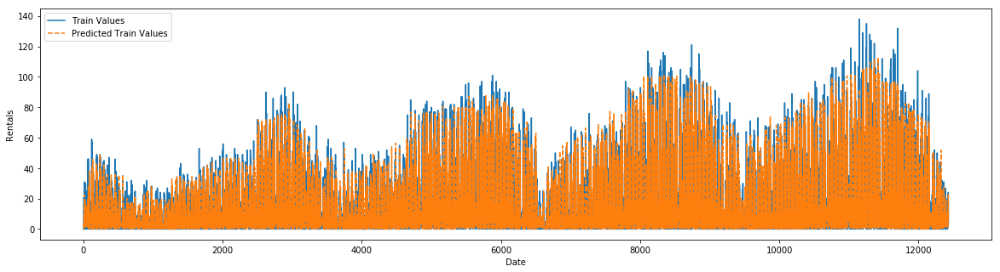

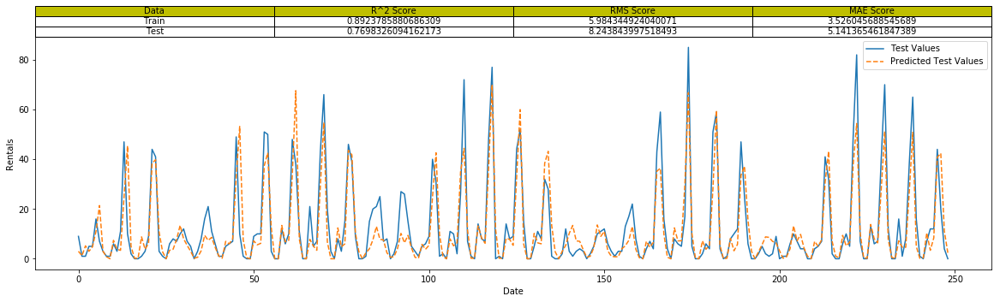

Test Data taking from: 2020-2 for 29 days | Split at index: 12680


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8944495973353555', '5.920058135531754', '3.4920347003154575'], ['Test', '0.5495328953985607', '9.333597993386363', '4.994849785407726']]


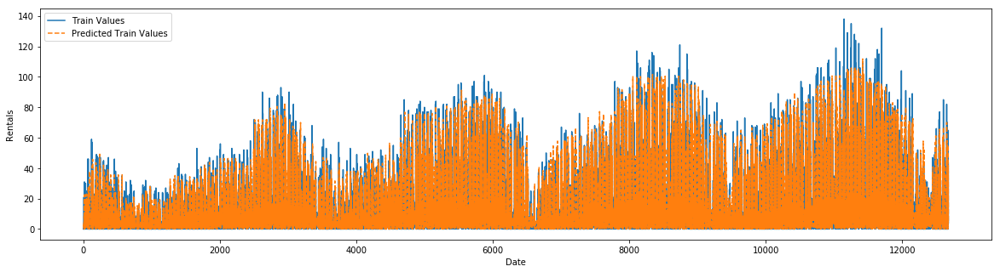

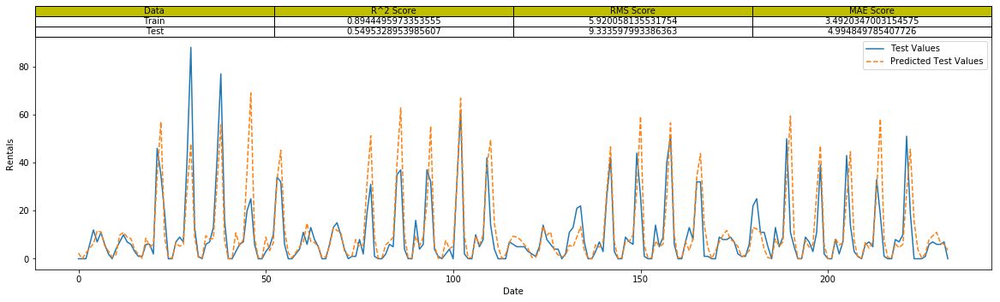

Test Data taking from: 2020-3 for 31 days | Split at index: 12912


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8927351393041161', '5.946725745145826', '3.5003252788104087'], ['Test', '-1.40276310135373', '12.951618341762652', '7.008032128514057']]


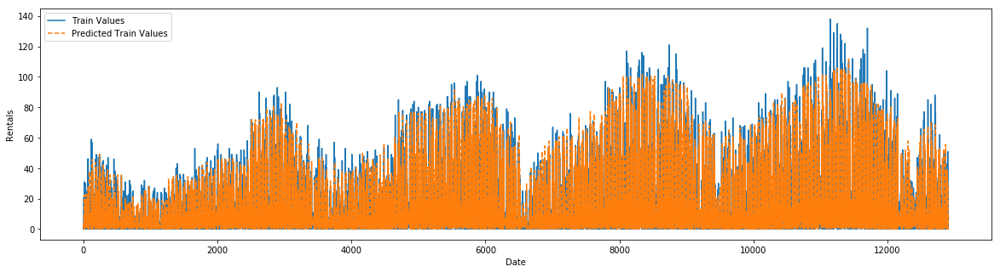

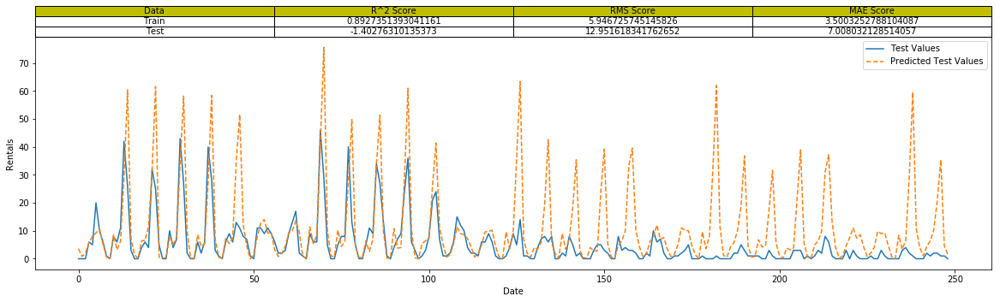

Test Data taking from: 2020-4 for 30 days | Split at index: 13160


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8920507843657811', '5.930164249353985', '3.485030395136778'], ['Test', '-78.78090371643177', '17.97112945187179', '11.13609958506224']]


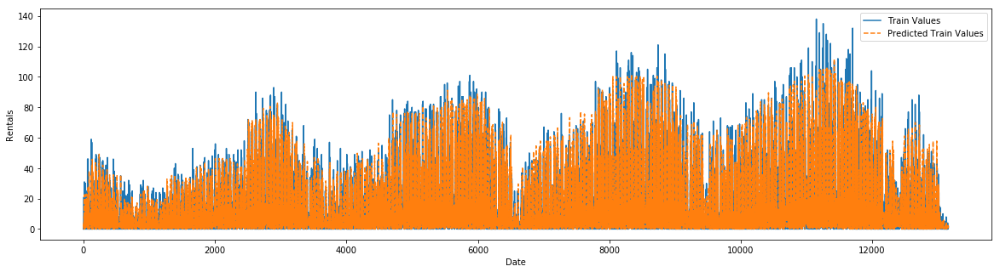

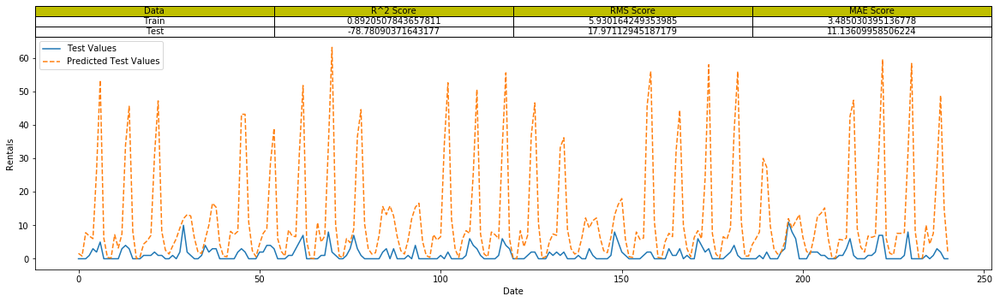

Test Data taking from: 2020-5 for 31 days | Split at index: 13400


D:\Anaconda\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Model:  KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=2,
          weights='uniform') 

Performance and Predictions Trend: 
[['Train', '0.8926433694847798', '5.88138322647967', '3.4390746268656716'], ['Test', '-7.659820059520813', '16.298896657690193', '9.537903225806453']]


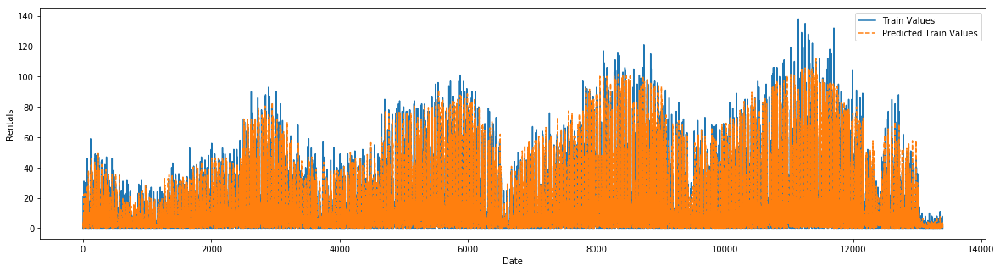

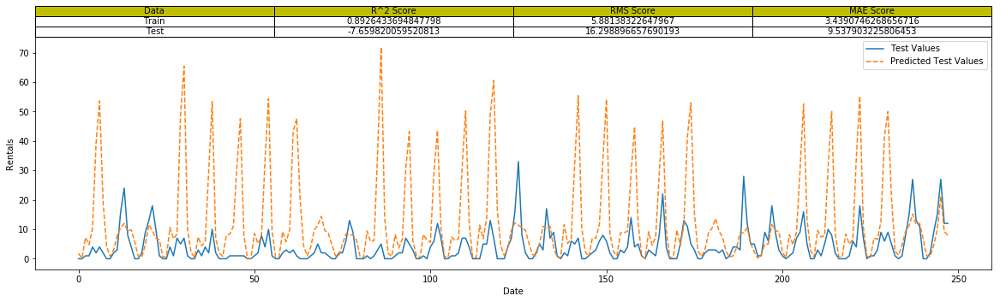

In [140]:
f, t = timeline_forecast(2019,1,2020,5)

### Now I can Plot and Save it.

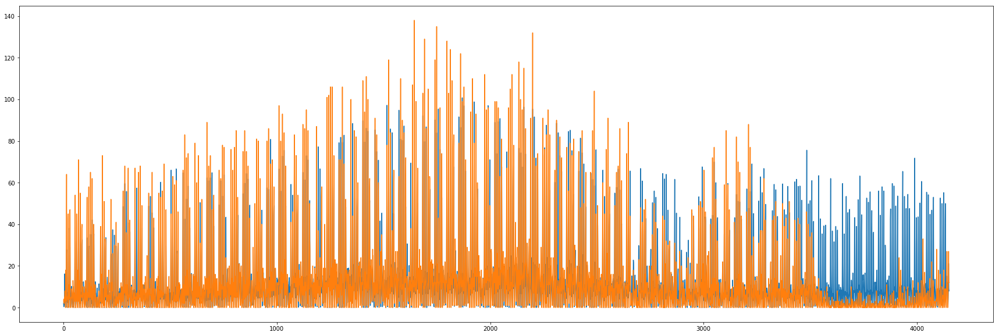

In [141]:
plt.figure(figsize=(30,10))
plt.plot(f)
plt.plot(t)

In [148]:
pd.DataFrame(f).to_csv("./output/timeline_forecasts.csv")
pd.DataFrame(t).to_csv("./output/timeline_true_vals.csv")

#### Covid Impact can be noticed and easilty estimated, Business Loss can also be calculated from above

- Written By: Pulkit Mehta (https://github.com/pulkitmehta)
- Full Project Repo: https://github.com/pulkitmehta/bikeIntel


# -- END--